In [1]:
import numpy as np
import pandas as pd
import lightgbm as lgb
from rdkit import Chem
import plotly.express as px
from rdkit.Chem import AllChem
import plotly.graph_objects as go

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Function to generate Morgan fingerprints
def generate_fingerprint(smiles, radius=2, nBits=2048):
    mol = Chem.MolFromSmiles(smiles)
    if mol is not None:
        morgan_gen = AllChem.GetMorganGenerator(radius=radius, fpSize=nBits)
        return list(morgan_gen.GetFingerprint(mol))
    return [0] * nBits
    
dataset = pd.read_csv("dataset/SMRT_dataset.csv").sort_values(by='date').reset_index(drop=True)
dataset['fingerprint'] = dataset['SMILES'].apply(lambda x: generate_fingerprint(x)) 

# LGBM models

## LGBM-Random model

Training LightGBM model...


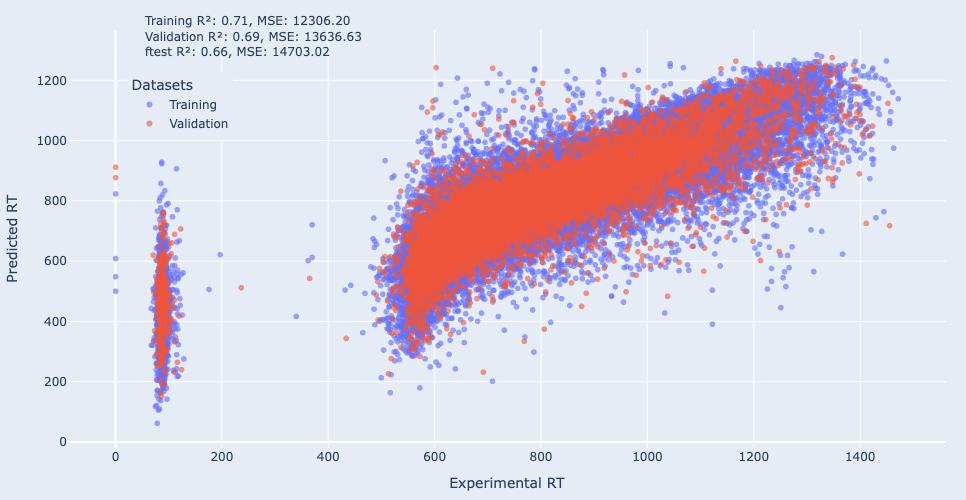

In [2]:
import random, os

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
os.environ['PYTHONHASHSEED'] = str(SEED)

# Randomly split the dataset into training and validation sets
dataset_clean,ftest_set = dataset.iloc[:int(0.85*dataset.shape[0]),:],dataset.iloc[int(0.85*dataset.shape[0]):,]
train_set, valid_set = train_test_split(dataset_clean, test_size=0.176, random_state=42)

# Prepare data for LightGBM
X_train = np.array(train_set['fingerprint'].tolist())
y_train = train_set['rt']
X_valid = np.array(valid_set['fingerprint'].tolist())
y_valid = valid_set['rt']
X_ftest = np.array(ftest_set['fingerprint'].tolist())
y_ftest = ftest_set['rt']

# Train a LightGBM model with default parameters
train_data = lgb.Dataset(X_train, label=y_train)
valid_data = lgb.Dataset(X_valid, label=y_valid, reference=train_data)

print("Training LightGBM model...")
lgb_params = {
    "objective": "regression",
    "metric": "l2",
    "verbosity": -1,
    "seed": SEED
}
model = lgb.train(lgb_params, train_data, valid_sets=[valid_data])

# Make predictions on the training and validation sets
train_set['predicted_rt'] = model.predict(X_train)
valid_set['predicted_rt'] = model.predict(X_valid)

# Calculate R^2 and MSE for training and validation sets
train_r2 = r2_score(y_train, train_set['predicted_rt'])
train_mse = mean_squared_error(y_train, train_set['predicted_rt'])
valid_r2 = r2_score(y_valid, valid_set['predicted_rt'])
valid_mse = mean_squared_error(y_valid, valid_set['predicted_rt'])

ftest_r2 = r2_score(y_ftest, model.predict(X_ftest))
ftest_mse = mean_squared_error(y_ftest, model.predict(X_ftest))


# Combine training and validation for scatter plot
train_set['set'] = 'Training'
valid_set['set'] = 'Validation'
combined_data = pd.concat([train_set[['rt', 'predicted_rt', 'set']], valid_set[['rt', 'predicted_rt', 'set']]])

# Scatter plot for training and validation sets
title_text = (
    f"Training R²: {train_r2:.2f}, MSE: {train_mse:.2f}<br>"
    f"Validation R²: {valid_r2:.2f}, MSE: {valid_mse:.2f}<br>"
    f"ftest R²: {ftest_r2:.2f}, MSE: {ftest_mse:.2f}"
)

fig = px.scatter(
    combined_data, x='rt', y='predicted_rt', color='set',
    title=title_text,
    labels={'rt': 'Experimental RT', 'predicted_rt': 'Predicted RT'},
    opacity=0.6
)

fig.update_layout(
    plot_bgcolor='rgba(229, 236, 246,1)',
    paper_bgcolor='rgba(229, 236, 246,1)',
    width=800,
    height=500,
    margin=dict(l=20, r=20, t=30, b=20),
    title_font_size=12, # Adjust title font size here
    title_x=0.15, # Center the title horizontally (0 is left, 1 is right)
    title_y=0.95, # Adjust vertical position (0 is bottom, 1 is top)
    legend=dict(
        title="Datasets", # Change legend title
        yanchor="top",
        y=0.9,
        xanchor="left",
        x=0.07
    )
)

fig.show()
fig.write_image("images/Figure-3.1-LGBM-Random-Without-Opt.svg")

## Hyperparameters tuning for LGBM-Random

In [3]:
import optuna
import plotly.graph_objects as go
from IPython.display import display


def make_plotly_optuna_callback(
    title="Optuna Optimization Progress",
    yaxis_title="Objective Value",
    save_path=None,   # e.g. "images/optuna_progress.svg"
    n_trials=None,
):
    fig = go.FigureWidget()

    fig.add_scatter(
        x=[],
        y=[],
        mode="markers",
        name="Trial value",
        marker=dict(size=10)
    )

    fig.add_scatter(
        x=[],
        y=[],
        mode="lines+markers",
        name="Best so far"
    )

    fig.update_layout(
        #title=title,
        plot_bgcolor='rgba(229, 236, 246,1)',
        paper_bgcolor='rgba(229, 236, 246,1)',
        xaxis_title="Trial",
        yaxis_title=yaxis_title,
        width=800,
        height=500,
        margin=dict(l=20, r=20, t=30, b=20),
        legend=dict(
                    x=0.8,
                    y=0.8,
                    xanchor="right",
                    yanchor="top"
                )
    )

    display(fig)  # MUST be called once only

    def callback(study: optuna.Study, trial: optuna.trial.FrozenTrial):

        # Collect only completed trials
        trials = [t for t in study.trials if t.value is not None]
        if not trials:
            return

        xs = [t.number for t in trials]
        ys = [t.value for t in trials]

        # Compute running best
        best = []
        current = float("inf") if study.direction == optuna.study.StudyDirection.MINIMIZE else float("-inf")

        for v in ys:
            if study.direction == optuna.study.StudyDirection.MINIMIZE:
                current = min(current, v)
            else:
                current = max(current, v)
            best.append(current)

        with fig.batch_update():
            fig.data[0].x = xs
            fig.data[0].y = ys
            fig.data[1].x = xs
            fig.data[1].y = best
        if save_path and n_trials is not None:
            try:
                if trial.number == (n_trials - 1) and trial.state == optuna.trial.TrialState.COMPLETE:
                    fig.write_image(save_path)
            except Exception as e:
                print(f"Warning: could not save Optuna figure: {e}")

    return callback, fig

In [4]:
import warnings
from sklearn.metrics import mean_squared_error

# Suppress the specific UserWarning about feature names
warnings.filterwarnings('ignore', category=UserWarning, 
                        message='X does not have valid feature names')


# Define the objective function for Optuna
def objective(trial):
    params = {
        'min_gain_to_split': 0.0,
        'min_data_in_leaf': 1,
        'n_estimators': trial.suggest_int('n_estimators', 20, 100),
        'learning_rate': trial.suggest_float('learning_rate', 1e-2, 1, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 20, 300),
        'max_depth': trial.suggest_int('max_depth', 10, 50),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-4, 0.1, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-4, 0.1, log=True),
        "random_state": SEED
    }

    # Perform cross-validation
    lgb_model = lgb.LGBMRegressor(**params,verbosity=-1)
    #mse = -cross_val_score(lgb_model, X_train, y_train, cv=5, scoring=make_scorer(mean_squared_error,greater_is_better=False)).mean()
    lgb_model.fit(X_train, y_train)
    valid_predictions = lgb_model.predict(X_valid)
    mse = mean_squared_error(y_valid, valid_predictions)
    return mse


n_trials = 50
cb, fig = make_plotly_optuna_callback(
    title=None,
    yaxis_title="MSE",
    save_path="images/Figure-3.2-lgbm-random-optuna_progress.svg",
    n_trials=n_trials,
)

study = optuna.create_study(direction="minimize")
study.optimize(
    objective,
    n_trials=n_trials,
    callbacks=[cb]
)

FigureWidget({
    'data': [{'marker': {'size': 10},
              'mode': 'markers',
              'name': 'Trial value',
              'type': 'scatter',
              'uid': 'b1e1c8ce-6b48-4874-848b-3685dfcb6a27',
              'x': [],
              'y': []},
             {'mode': 'lines+markers',
              'name': 'Best so far',
              'type': 'scatter',
              'uid': 'd70418e2-e26f-41e1-b976-75465bbf5400',
              'x': [],
              'y': []}],
    'layout': {'height': 500,
               'legend': {'x': 0.8, 'xanchor': 'right', 'y': 0.8, 'yanchor': 'top'},
               'margin': {'b': 20, 'l': 20, 'r': 20, 't': 30},
               'paper_bgcolor': 'rgba(229, 236, 246,1)',
               'plot_bgcolor': 'rgba(229, 236, 246,1)',
               'template': '...',
               'width': 800,
               'xaxis': {'title': {'text': 'Trial'}},
               'yaxis': {'title': {'text': 'MSE'}}}
})

[I 2026-01-11 16:15:23,736] A new study created in memory with name: no-name-e6e4e0ef-ccda-496c-9138-dbdfc4188d5d
[I 2026-01-11 16:15:26,476] Trial 0 finished with value: 24054.54369624418 and parameters: {'n_estimators': 73, 'learning_rate': 0.012360488839828947, 'num_leaves': 287, 'max_depth': 39, 'min_child_samples': 59, 'reg_alpha': 0.07277070573163498, 'reg_lambda': 0.00022421088230077516}. Best is trial 0 with value: 24054.54369624418.
[I 2026-01-11 16:15:27,580] Trial 1 finished with value: 29384.389279442406 and parameters: {'n_estimators': 51, 'learning_rate': 0.02224435843922193, 'num_leaves': 22, 'max_depth': 23, 'min_child_samples': 9, 'reg_alpha': 0.029292443829517022, 'reg_lambda': 0.014754502536747883}. Best is trial 0 with value: 24054.54369624418.
[I 2026-01-11 16:15:29,554] Trial 2 finished with value: 10678.97414855627 and parameters: {'n_estimators': 72, 'learning_rate': 0.16371959603867758, 'num_leaves': 160, 'max_depth': 49, 'min_child_samples': 49, 'reg_alpha': 0

## Reproduce the best LGBM-Random model

In [5]:
# Get the best parameters
best_params = study.best_params
print("Best parameters:", best_params)

# Train the LightGBM model with the best parameters
model = lgb.LGBMRegressor(**best_params,verbosity=-1)
#model = lgb.LGBMRegressor()
model.fit(X_train, y_train)

# Make predictions on the training and validation sets
train_set['predicted_rt'] = model.predict(X_train)
valid_set['predicted_rt'] = model.predict(X_valid)

# Calculate R^2 and MSE for training and validation sets
train_r2 = r2_score(y_train, train_set['predicted_rt'])
train_mse = mean_squared_error(y_train, train_set['predicted_rt'])
valid_r2 = r2_score(y_valid, valid_set['predicted_rt'])
valid_mse = mean_squared_error(y_valid, valid_set['predicted_rt'])
ftest_r2 = r2_score(y_ftest, model.predict(X_ftest))
ftest_mse = mean_squared_error(y_ftest, model.predict(X_ftest))


# Combine training and validation for scatter plot
train_set['set'] = 'Training'
valid_set['set'] = 'Validation'
combined_data = pd.concat([train_set[['rt', 'predicted_rt', 'set']], valid_set[['rt', 'predicted_rt', 'set']]])

# Scatter plot for training and validation sets
title_text = (
    f"Training R²: {train_r2:.2f}, MSE: {train_mse:.1f}<br>"
    f"Validation R²: {valid_r2:.2f}, MSE: {valid_mse:.1f}<br>"
    f"ftest R²: {ftest_r2:.2f}, MSE: {ftest_mse:.1f}"
)

fig = px.scatter(
    combined_data, x='rt', y='predicted_rt', color='set',
    title=title_text,
    labels={'rt': 'Experimental RT', 'predicted_rt': 'Predicted RT'},
    opacity=0.6
)

fig.update_layout(
    plot_bgcolor='rgba(229, 236, 246,1)',
    paper_bgcolor='rgba(229, 236, 246,1)',
    width=800,
    height=500,
    margin=dict(l=20, r=20, t=30, b=20),
    title_font_size=12, # Adjust title font size here
    title_x=0.15, # Center the title horizontally (0 is left, 1 is right)
    title_y=0.95, # Adjust vertical position (0 is bottom, 1 is top)
    legend=dict(
        title="Datasets", # Change legend title
        yanchor="top",
        y=0.9,
        xanchor="left",
        x=0.07
    )
)

fig.show()
fig.write_image("images/Figure-3.2-LGBM-Random-Opt.svg")

Best parameters: {'n_estimators': 97, 'learning_rate': 0.16780082531780013, 'num_leaves': 209, 'max_depth': 39, 'min_child_samples': 94, 'reg_alpha': 0.026287817077563107, 'reg_lambda': 0.052237623365539824}


## LGBM-Chronological model

In [6]:
import warnings
warnings.filterwarnings('ignore', category=pd.errors.SettingWithCopyWarning)

# Chronological split the dataset into training and validation sets
train_set, valid_set = dataset_clean.iloc[:int(0.824*dataset_clean.shape[0]),:], dataset_clean.iloc[int(0.824*dataset_clean.shape[0]):,:]

# Prepare data for LightGBM
X_train = np.array(train_set['fingerprint'].tolist())
y_train = train_set['rt']
X_valid = np.array(valid_set['fingerprint'].tolist())
y_valid = valid_set['rt']
X_ftest = np.array(ftest_set['fingerprint'].tolist())
y_ftest = ftest_set['rt']

# Train a LightGBM model with default parameters
train_data = lgb.Dataset(X_train, label=y_train)
valid_data = lgb.Dataset(X_valid, label=y_valid, reference=train_data)

print("Training LightGBM model...")
model = lgb.train(lgb_params, train_data, valid_sets=[valid_data],)

# Make predictions on the training and validation sets
train_set['predicted_rt'] = model.predict(X_train)
valid_set['predicted_rt'] = model.predict(X_valid)

# Calculate R^2 and MSE for training and validation sets
train_r2 = r2_score(y_train, train_set['predicted_rt'])
train_mse = mean_squared_error(y_train, train_set['predicted_rt'])
valid_r2 = r2_score(y_valid, valid_set['predicted_rt'])
valid_mse = mean_squared_error(y_valid, valid_set['predicted_rt'])

ftest_r2 = r2_score(y_ftest, model.predict(X_ftest))
ftest_mse = mean_squared_error(y_ftest, model.predict(X_ftest))


# Combine training and validation for scatter plot
train_set['set'] = 'Training'
valid_set['set'] = 'Validation'
combined_data = pd.concat([train_set[['rt', 'predicted_rt', 'set']], valid_set[['rt', 'predicted_rt', 'set']]])

# Scatter plot for training and validation sets
title_text = (
    f"Training R²: {train_r2:.2f}, MSE: {train_mse:.1f}<br>"
    f"Validation R²: {valid_r2:.2f}, MSE: {valid_mse:.1f}<br>"
    f"ftest R²: {ftest_r2:.2f}, MSE: {ftest_mse:.1f}"
)

fig = px.scatter(
    combined_data, x='rt', y='predicted_rt', color='set',
    title=title_text,
    labels={'rt': 'Experimental RT', 'predicted_rt': 'Predicted RT'},
    opacity=0.6
)

fig.update_layout(
    plot_bgcolor='rgba(229, 236, 246,1)',
    paper_bgcolor='rgba(229, 236, 246,1)',
    width=800,
    height=500,
    margin=dict(l=20, r=20, t=30, b=20),
    title_font_size=12, # Adjust title font size here
    title_x=0.15, # Center the title horizontally (0 is left, 1 is right)
    title_y=0.95, # Adjust vertical position (0 is bottom, 1 is top)
    legend=dict(
        title="Datasets", # Change legend title
        yanchor="top",
        y=0.9,
        xanchor="left",
        x=0.07
    )
)

fig.show()
fig.write_image("images/Figure-3.3-LGBM-Chronological-Without-Opt.svg")

Training LightGBM model...


## Hyperparameters tuning for LGBM-Chronological

In [7]:
import plotly.graph_objects as go
import warnings

# Suppress the specific UserWarning about feature names
warnings.filterwarnings('ignore', category=UserWarning, 
                        message='X does not have valid feature names')


# Define the objective function for Optuna
def objective(trial):
    params = {
        'min_gain_to_split': 0.0,
        'min_data_in_leaf': 1,
        'n_estimators': trial.suggest_int('n_estimators', 20, 100),
        'learning_rate': trial.suggest_float('learning_rate', 1e-2, 1, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 20, 300),
        'max_depth': trial.suggest_int('max_depth', 10, 50),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-4, 0.1, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-4, 0.1, log=True),
        'random_state': SEED
    }

    # Perform cross-validation
    lgb_model = lgb.LGBMRegressor(**params,verbosity=-1)
    #mse = -cross_val_score(lgb_model, X_train, y_train, cv=5, scoring=make_scorer(mean_squared_error,greater_is_better=False)).mean()
    lgb_model.fit(X_train, y_train)
    valid_predictions = lgb_model.predict(X_valid)
    mse = mean_squared_error(y_valid, valid_predictions)
    return mse


# optimization
n_trials = 50
cb, fig = make_plotly_optuna_callback(
    title="Visualization Optimization",
    yaxis_title="MSE",
    save_path="images/Figure-3.3-lgbm-chronological-optuna-progress.svg",
    n_trials=n_trials,
)

study = optuna.create_study(direction="minimize")
study.optimize(
    objective,
    n_trials=n_trials,
    callbacks=[cb]
)

FigureWidget({
    'data': [{'marker': {'size': 10},
              'mode': 'markers',
              'name': 'Trial value',
              'type': 'scatter',
              'uid': '29604d7b-6530-4bd2-8e19-a60e11c146f8',
              'x': [],
              'y': []},
             {'mode': 'lines+markers',
              'name': 'Best so far',
              'type': 'scatter',
              'uid': '068a6707-227a-45a0-b313-3e60d468c924',
              'x': [],
              'y': []}],
    'layout': {'height': 500,
               'legend': {'x': 0.8, 'xanchor': 'right', 'y': 0.8, 'yanchor': 'top'},
               'margin': {'b': 20, 'l': 20, 'r': 20, 't': 30},
               'paper_bgcolor': 'rgba(229, 236, 246,1)',
               'plot_bgcolor': 'rgba(229, 236, 246,1)',
               'template': '...',
               'width': 800,
               'xaxis': {'title': {'text': 'Trial'}},
               'yaxis': {'title': {'text': 'MSE'}}}
})

[I 2026-01-11 15:56:33,986] A new study created in memory with name: no-name-10e8d259-913f-4c82-a82f-b15a2b2706d7
[I 2026-01-11 15:56:38,084] Trial 0 finished with value: 16886.64339400441 and parameters: {'n_estimators': 42, 'learning_rate': 0.7672674849397122, 'num_leaves': 280, 'max_depth': 26, 'min_child_samples': 22, 'reg_alpha': 0.003792718242251838, 'reg_lambda': 0.00017893828485085407}. Best is trial 0 with value: 16886.64339400441.
[I 2026-01-11 15:56:42,144] Trial 1 finished with value: 11414.180458633815 and parameters: {'n_estimators': 47, 'learning_rate': 0.14117134447440416, 'num_leaves': 243, 'max_depth': 27, 'min_child_samples': 45, 'reg_alpha': 0.00045109098737519096, 'reg_lambda': 0.0104261666530631}. Best is trial 1 with value: 11414.180458633815.
[I 2026-01-11 15:56:43,944] Trial 2 finished with value: 23509.299618063425 and parameters: {'n_estimators': 25, 'learning_rate': 0.047346098228301714, 'num_leaves': 139, 'max_depth': 22, 'min_child_samples': 78, 'reg_alpha

## Reproduce the best LGBM-Chronological model


In [8]:
# Get the best parameters
# Suppress the specific UserWarning about feature names
warnings.filterwarnings('ignore', category=UserWarning, 
                        message='X does not have valid feature names')
best_params = study.best_params
print("Best parameters:", best_params)

# Train the LightGBM model with the best parameters
model = lgb.LGBMRegressor(**best_params,verbosity=-1)
model.fit(X_train, y_train)

# Make predictions on the training and validation sets
train_set['predicted_rt'] = model.predict(X_train)
valid_set['predicted_rt'] = model.predict(X_valid)

# Calculate R^2 and MSE for training and validation sets
train_r2 = r2_score(y_train, train_set['predicted_rt'])
train_mse = mean_squared_error(y_train, train_set['predicted_rt'])
valid_r2 = r2_score(y_valid, valid_set['predicted_rt'])
valid_mse = mean_squared_error(y_valid, valid_set['predicted_rt'])
ftest_r2 = r2_score(y_ftest, model.predict(X_ftest))
ftest_mse = mean_squared_error(y_ftest, model.predict(X_ftest))


# Combine training and validation for scatter plot
train_set['set'] = 'Training'
valid_set['set'] = 'Validation'
combined_data = pd.concat([train_set[['rt', 'predicted_rt', 'set']], valid_set[['rt', 'predicted_rt', 'set']]])

# Scatter plot for training and validation sets
title_text = (
    f"Training R²: {train_r2:.2f}, MSE: {train_mse:.1f}<br>"
    f"Validation R²: {valid_r2:.2f}, MSE: {valid_mse:.1f}<br>"
    f"ftest R²: {ftest_r2:.2f}, MSE: {ftest_mse:.1f}"
)

fig = px.scatter(
    combined_data, x='rt', y='predicted_rt', color='set',
    title=title_text,
    labels={'rt': 'Actual RT', 'predicted_rt': 'Predicted RT'},
    opacity=0.6
)

fig.update_layout(
    plot_bgcolor='rgba(229, 236, 246,1)',
    paper_bgcolor='rgba(229, 236, 246,1)',
    width=800,
    height=500,
    margin=dict(l=20, r=20, t=30, b=20),
    title_font_size=12, # Adjust title font size here
    title_x=0.15, # Center the title horizontally (0 is left, 1 is right)
    title_y=0.95, # Adjust vertical position (0 is bottom, 1 is top)
    legend=dict(
        title="Datasets", # Change legend title
        yanchor="top",
        y=0.9,
        xanchor="left",
        x=0.07
    )
)

fig.show()
fig.write_image("images/Figure-3.4-LGBM-Chronological-Opt.svg")

Best parameters: {'n_estimators': 95, 'learning_rate': 0.11690420063664966, 'num_leaves': 270, 'max_depth': 38, 'min_child_samples': 44, 'reg_alpha': 0.001958336815198313, 'reg_lambda': 0.011628995970837455}


# Graphic Neural Networks

## GCN-Random model

In [5]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd
from pyg_chemprop_utils import smiles2data,initialize_weights
from pyg_chemprop import GCNEncoder,train,make_prediction
from torch_geometric.loader import DataLoader
import torch

import torch
import numpy as np
import random
import os

def seed_everything(seed: int = 42):
    """
    Set random seeds for reproducibility across PyTorch, NumPy, and Python.
    
    Args:
        seed: Integer seed value (default: 42)
    """
    # Set basic seeds
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    
    # CUDA-specific seeds (only if CUDA is available)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)  # if using multi-GPU
        
        # Set deterministic flags for CUDA (may impact performance)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False
        
        # Get CUDA device info for logging
        device_name = torch.cuda.get_device_name(0) if torch.cuda.device_count() > 0 else "Unknown"
        print(f"Set all random seeds to {seed} | Using GPU: {device_name}")
    else:
        print(f"Set all random seeds to {seed} | Using CPU only")
    
    return seed

# Usage example
seed_everything(42)


dataset = pd.read_csv("dataset/SMRT_dataset.csv").sort_values(by='date').reset_index(drop=True)
dataset_clean = dataset.iloc[:int(0.85*dataset.shape[0]),:]
ftest_set = dataset.iloc[int(0.85*dataset.shape[0]):,]
# Randomly split the dataset into training and validation sets
train_set, valid_set = train_test_split(dataset_clean, test_size=0.176, random_state=42)

# Build graph dataset from train/valid splits
smiles_col = "SMILES"  
rt_col = "rt"          
train_graphs = []
for _, row in train_set.iterrows():
    data = smiles2data(row[smiles_col])
    data['y'] = row[rt_col]
    if data is not None:
        train_graphs.append(data)

valid_graphs = []
for _, row in valid_set.iterrows():
    data = smiles2data(row[smiles_col])
    data['y'] = row[rt_col]
    if data is not None:
        valid_graphs.append(data)

ftest_graphs = []
for _, row in ftest_set.iterrows():
    data = smiles2data(row[smiles_col])
    data['y'] = row[rt_col]
    if data is not None:
        ftest_graphs.append(data)
len(train_graphs), len(valid_graphs), len(ftest_graphs)

Set all random seeds to 42 | Using GPU: NVIDIA GeForce RTX 5090


(56058, 11974, 12006)

In [6]:
# Set a global seed
seed = 42
torch.manual_seed(seed)

# Create a generator with the seed
generator = torch.Generator()
generator.manual_seed(seed)
batch_size = 128
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=True,generator=generator)
valid_loader = DataLoader(valid_graphs, batch_size=batch_size, shuffle=False)
ftest_loader = DataLoader(ftest_graphs, batch_size=batch_size, shuffle=False)

In [7]:
num_epochs = 50
hidden_size = 512
depth = 3
out_dim = 1
dropout = 0.1

In [8]:
from torch import nn
head = nn.Sequential(
    nn.Linear(hidden_size, hidden_size, bias=True),
    nn.ReLU(),
    nn.Linear(hidden_size, hidden_size//2, bias=True),
    nn.ReLU(),
    nn.Linear(hidden_size//2, out_dim, bias=True),
)
model = nn.Sequential(
    GCNEncoder(
        hidden_size,
        train_loader.dataset[0].num_node_features,
        depth,
        dropout=dropout
    ),
    head,
)
initialize_weights(model)

In [9]:
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.MSELoss()
scheduler = torch.optim.lr_scheduler.OneCycleLR(
    optimizer, max_lr=1e-3, steps_per_epoch=len(train_loader), epochs=num_epochs
)
config = {
    "loss": criterion,
    "model": model,
    "optimizer": optimizer,
    "scheduler": scheduler,
}

for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}")
    train(config, train_loader)
    y_pred, y_true = make_prediction(config, valid_loader)
    mse = mean_squared_error(y_true, y_pred.squeeze())
    r2 = r2_score(y_true, y_pred.squeeze())
    print(f"val r2={r2:.2} mse={mse:.2}")

Epoch 1


100%|██████████| 94/94 [00:00<00:00, 148.12it/s]


val r2=0.074 mse=4e+04
Epoch 2


100%|██████████| 94/94 [00:00<00:00, 149.96it/s]


val r2=0.13 mse=3.8e+04
Epoch 3


100%|██████████| 94/94 [00:00<00:00, 163.22it/s]


val r2=0.18 mse=3.6e+04
Epoch 4


100%|██████████| 94/94 [00:00<00:00, 165.18it/s]


val r2=0.27 mse=3.2e+04
Epoch 5


100%|██████████| 94/94 [00:00<00:00, 167.50it/s]


val r2=0.39 mse=2.6e+04
Epoch 6


100%|██████████| 94/94 [00:00<00:00, 163.34it/s]


val r2=0.45 mse=2.4e+04
Epoch 7


100%|██████████| 94/94 [00:00<00:00, 166.09it/s]


val r2=0.48 mse=2.3e+04
Epoch 8


100%|██████████| 94/94 [00:00<00:00, 167.74it/s]


val r2=0.44 mse=2.4e+04
Epoch 9


100%|██████████| 94/94 [00:00<00:00, 161.44it/s]


val r2=0.52 mse=2.1e+04
Epoch 10


100%|██████████| 94/94 [00:01<00:00, 84.35it/s] 


val r2=0.37 mse=2.7e+04
Epoch 11


100%|██████████| 94/94 [00:00<00:00, 164.19it/s]


val r2=0.5 mse=2.2e+04
Epoch 12


100%|██████████| 94/94 [00:00<00:00, 166.67it/s]


val r2=0.54 mse=2e+04
Epoch 13


100%|██████████| 94/94 [00:00<00:00, 164.13it/s]


val r2=0.44 mse=2.4e+04
Epoch 14


100%|██████████| 94/94 [00:00<00:00, 161.57it/s]


val r2=0.56 mse=1.9e+04
Epoch 15


100%|██████████| 94/94 [00:00<00:00, 164.60it/s]


val r2=0.6 mse=1.8e+04
Epoch 16


100%|██████████| 94/94 [00:00<00:00, 140.30it/s]


val r2=0.61 mse=1.7e+04
Epoch 17


100%|██████████| 94/94 [00:00<00:00, 163.52it/s]


val r2=0.63 mse=1.6e+04
Epoch 18


100%|██████████| 94/94 [00:00<00:00, 163.13it/s]


val r2=0.62 mse=1.7e+04
Epoch 19


100%|██████████| 94/94 [00:00<00:00, 166.28it/s]


val r2=0.64 mse=1.6e+04
Epoch 20


100%|██████████| 94/94 [00:00<00:00, 166.47it/s]


val r2=0.65 mse=1.5e+04
Epoch 21


100%|██████████| 94/94 [00:00<00:00, 163.99it/s]


val r2=0.66 mse=1.5e+04
Epoch 22


100%|██████████| 94/94 [00:00<00:00, 156.03it/s]


val r2=0.63 mse=1.6e+04
Epoch 23


100%|██████████| 94/94 [00:00<00:00, 155.98it/s]


val r2=0.68 mse=1.4e+04
Epoch 24


100%|██████████| 94/94 [00:00<00:00, 166.75it/s]


val r2=0.69 mse=1.3e+04
Epoch 25


100%|██████████| 94/94 [00:00<00:00, 163.21it/s]


val r2=0.68 mse=1.4e+04
Epoch 26


100%|██████████| 94/94 [00:01<00:00, 90.20it/s] 


val r2=0.67 mse=1.4e+04
Epoch 27


100%|██████████| 94/94 [00:00<00:00, 157.75it/s]


val r2=0.7 mse=1.3e+04
Epoch 28


100%|██████████| 94/94 [00:00<00:00, 157.95it/s]


val r2=0.69 mse=1.3e+04
Epoch 29


100%|██████████| 94/94 [00:00<00:00, 150.21it/s]


val r2=0.69 mse=1.3e+04
Epoch 30


100%|██████████| 94/94 [00:00<00:00, 148.74it/s]


val r2=0.7 mse=1.3e+04
Epoch 31


100%|██████████| 94/94 [00:00<00:00, 159.73it/s]


val r2=0.72 mse=1.2e+04
Epoch 32


100%|██████████| 94/94 [00:00<00:00, 157.05it/s]


val r2=0.72 mse=1.2e+04
Epoch 33


100%|██████████| 94/94 [00:00<00:00, 157.48it/s]


val r2=0.73 mse=1.2e+04
Epoch 34


100%|██████████| 94/94 [00:00<00:00, 161.65it/s]


val r2=0.73 mse=1.2e+04
Epoch 35


100%|██████████| 94/94 [00:00<00:00, 144.78it/s]


val r2=0.74 mse=1.1e+04
Epoch 36


100%|██████████| 94/94 [00:00<00:00, 162.12it/s]


val r2=0.73 mse=1.2e+04
Epoch 37


100%|██████████| 94/94 [00:00<00:00, 144.40it/s]


val r2=0.74 mse=1.1e+04
Epoch 38


100%|██████████| 94/94 [00:00<00:00, 157.70it/s]


val r2=0.75 mse=1.1e+04
Epoch 39


100%|██████████| 94/94 [00:00<00:00, 162.21it/s]


val r2=0.75 mse=1.1e+04
Epoch 40


100%|██████████| 94/94 [00:01<00:00, 85.17it/s] 


val r2=0.74 mse=1.1e+04
Epoch 41


100%|██████████| 94/94 [00:00<00:00, 159.15it/s]


val r2=0.75 mse=1.1e+04
Epoch 42


100%|██████████| 94/94 [00:00<00:00, 162.58it/s]


val r2=0.75 mse=1.1e+04
Epoch 43


100%|██████████| 94/94 [00:00<00:00, 166.97it/s]


val r2=0.75 mse=1.1e+04
Epoch 44


100%|██████████| 94/94 [00:00<00:00, 167.03it/s]


val r2=0.75 mse=1.1e+04
Epoch 45


100%|██████████| 94/94 [00:00<00:00, 160.33it/s]


val r2=0.75 mse=1.1e+04
Epoch 46


100%|██████████| 94/94 [00:00<00:00, 140.39it/s]


val r2=0.75 mse=1.1e+04
Epoch 47


100%|██████████| 94/94 [00:00<00:00, 161.89it/s]


val r2=0.76 mse=1.1e+04
Epoch 48


100%|██████████| 94/94 [00:00<00:00, 158.92it/s]


val r2=0.76 mse=1.1e+04
Epoch 49


100%|██████████| 94/94 [00:00<00:00, 165.45it/s]


val r2=0.76 mse=1.1e+04
Epoch 50


100%|██████████| 94/94 [00:00<00:00, 166.40it/s]

val r2=0.76 mse=1.1e+04


In [10]:
train_y_pred, train_y_true = make_prediction(config, train_loader)

100%|██████████| 438/438 [00:03<00:00, 139.28it/s]


In [15]:
train_y_true

tensor([691.4000, 718.6000, 585.6000,  ..., 555.7000, 874.7000, 592.7000])

In [14]:
train_y_pred.numpy().squeeze()

array([750.9109 , 721.65344, 598.0056 , ..., 526.2895 , 840.4203 ,
       538.9856 ], shape=(56058,), dtype=float32)

100%|██████████| 94/94 [00:00<00:00, 155.64it/s]


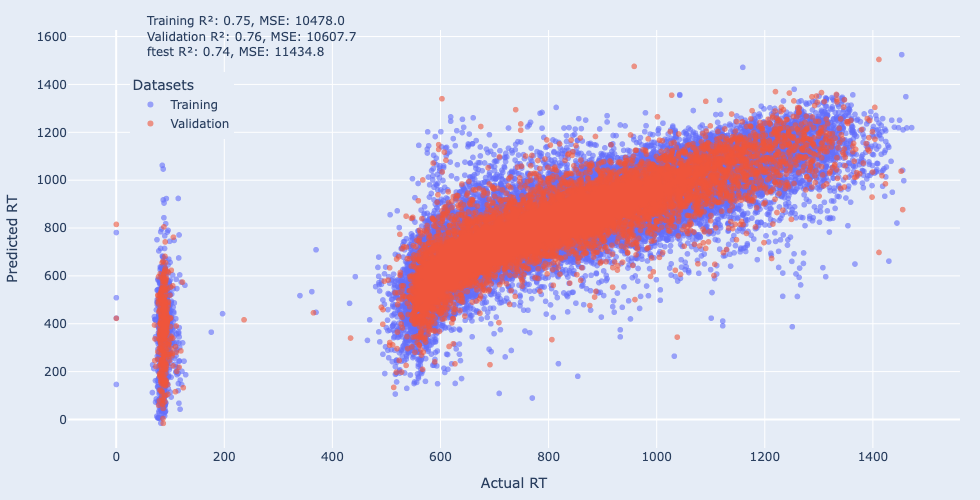

In [19]:
train_y_pred, train_y_true = make_prediction(config, train_loader)
#train_mse = mean_squared_error(train_y_true, train_y_pred.squeeze())
#train_r2 = r2_score(train_y_true, train_y_pred.squeeze())
#print(f"train r2={train_r2:.2} mse={train_mse:.2}")
valid_y_pred, valid_y_true = make_prediction(config, valid_loader)
#valid_mse = mean_squared_error(valid_y_true, valid_y_pred.squeeze())
#valid_r2 = r2_score(valid_y_true, valid_y_pred.squeeze())
#print(f"valid r2={valid_r2:.2} mse={valid_mse:.2}")
ftest_y_pred, ftest_y_true = make_prediction(config, ftest_loader)
#ftest_mse = mean_squared_error(ftest_y_true, ftest_y_pred.squeeze())
#ftest_r2 = r2_score(ftest_y_true, ftest_y_pred.squeeze())
#print(f"ftest r2={ftest_r2:.2} mse={ftest_mse:.2}")

# Combine training and validation for scatter plot
new_train_set = pd.DataFrame({"rt": train_y_true.numpy(),"predicted_rt": train_y_pred.numpy().squeeze()})
new_valid_set = pd.DataFrame({"rt": valid_y_true.numpy(),"predicted_rt": valid_y_pred.numpy().squeeze()})
new_train_set['set'] = 'Training'
new_valid_set['set'] = 'Validation'
combined_data = pd.concat([new_train_set[['rt', 'predicted_rt', 'set']], new_valid_set[['rt', 'predicted_rt', 'set']]])

# Scatter plot for training and validation sets
title_text = (
    f"Training R²: {train_r2:.2f}, MSE: {train_mse:.1f}<br>"
    f"Validation R²: {valid_r2:.2f}, MSE: {valid_mse:.1f}<br>"
    f"ftest R²: {ftest_r2:.2f}, MSE: {ftest_mse:.1f}"
)

fig = px.scatter(
    combined_data, x='rt', y='predicted_rt', color='set',
    title=title_text,
    labels={'rt': 'Actual RT', 'predicted_rt': 'Predicted RT'},
    opacity=0.6
)

fig.update_layout(
    plot_bgcolor='rgba(229, 236, 246,1)',
    paper_bgcolor='rgba(229, 236, 246,1)',
    width=800,
    height=500,
    margin=dict(l=20, r=20, t=30, b=20),
    title_font_size=12, # Adjust title font size here
    title_x=0.15, # Center the title horizontally (0 is left, 1 is right)
    title_y=0.95, # Adjust vertical position (0 is bottom, 1 is top)
    legend=dict(
        title="Datasets", # Change legend title
        yanchor="top",
        y=0.9,
        xanchor="left",
        x=0.07
    )
)

fig.show()
fig.write_image("images/Figure-3.5-GCN-Random-without-Opt.svg")

## Hyperparameters tuning for GCN-Random

In [20]:
import optuna
from torch import nn
import warnings
from pyg_chemprop import train_silent

# Suppress warnings
warnings.filterwarnings('ignore')

def objective(trial):
    # Hyperparameters to optimize
    hidden_size = trial.suggest_categorical('hidden_size', [128, 256, 512])
    depth = trial.suggest_int('depth', 2, 5)
    dropout = trial.suggest_float('dropout', 0.01, 0.5)
    learning_rate = trial.suggest_float('learning_rate', 1e-4, 1e-2, log=True)
    batch_size = trial.suggest_categorical('batch_size', [128, 256, 512])
    num_epochs = trial.suggest_int('num_epochs', 10, 100)
    
    
    # Using train_graphs and valid_graphs from the global scope
    train_loader_trial = DataLoader(train_graphs, batch_size=batch_size, shuffle=True)
    valid_loader_trial = DataLoader(valid_graphs, batch_size=batch_size, shuffle=False)
    
    # Model definition
    out_dim = 1
    head = nn.Sequential(
        nn.Linear(hidden_size, hidden_size, bias=True),
        nn.ReLU(),
        nn.Dropout(dropout),
        nn.Linear(hidden_size, hidden_size//2, bias=True),
        nn.ReLU(),
        nn.Dropout(dropout),
        nn.Linear(hidden_size//2, out_dim, bias=True),
    )
    
    model = nn.Sequential(
        GCNEncoder(
            hidden_size,
            train_graphs[0].num_node_features,
            depth,
            dropout=dropout
        ),
        head,
    )
    initialize_weights(model)
    
    # Training setup
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.MSELoss()
    
    scheduler = torch.optim.lr_scheduler.OneCycleLR(
        optimizer, max_lr=learning_rate*10, steps_per_epoch=len(train_loader_trial), epochs=num_epochs
    )
    
    config = {
        "loss": criterion,
        "model": model,
        "optimizer": optimizer,
        "scheduler": scheduler,
    }
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    # Training loop
    for epoch in range(num_epochs):
        train_silent(config, train_loader_trial, device=device)
        
    # Final Evaluation
    y_pred, y_true = make_prediction(config, valid_loader_trial, device=device)
    mse = mean_squared_error(y_true, y_pred.squeeze())
    
    return mse

# Visualization callback
n_trials = 50
cb, fig = make_plotly_optuna_callback(
    title="GCN Hyperparameter Optimization",
    yaxis_title="MSE",
    save_path="images/Figure-3.6-GCN-Random-Optuna-Progress.svg",
    n_trials=n_trials,
)

# Run optimization
study_gcn = optuna.create_study(direction="minimize")
study_gcn.optimize(
    objective,
    n_trials=n_trials,
    callbacks=[cb]
)

FigureWidget({
    'data': [{'marker': {'size': 10},
              'mode': 'markers',
              'name': 'Trial value',
              'type': 'scatter',
              'uid': 'bf81e310-3b7a-4bc8-9f13-1cbef86ab2db',
              'x': [],
              'y': []},
             {'mode': 'lines+markers',
              'name': 'Best so far',
              'type': 'scatter',
              'uid': '7e11b070-c11a-4d2f-9828-a638bd50cb79',
              'x': [],
              'y': []}],
    'layout': {'height': 500,
               'legend': {'x': 0.8, 'xanchor': 'right', 'y': 0.8, 'yanchor': 'top'},
               'margin': {'b': 20, 'l': 20, 'r': 20, 't': 30},
               'paper_bgcolor': 'rgba(229, 236, 246,1)',
               'plot_bgcolor': 'rgba(229, 236, 246,1)',
               'template': '...',
               'width': 800,
               'xaxis': {'title': {'text': 'Trial'}},
               'yaxis': {'title': {'text': 'MSE'}}}
})

[I 2026-01-11 16:31:39,493] A new study created in memory with name: no-name-4df4b012-5357-45a1-8a2d-9cf9b7064f53
100%|██████████| 94/94 [00:00<00:00, 143.63it/s]
[I 2026-01-11 16:32:55,077] Trial 0 finished with value: 16987.7421875 and parameters: {'hidden_size': 256, 'depth': 2, 'dropout': 0.2812755895387956, 'learning_rate': 0.0004576043758291868, 'batch_size': 128, 'num_epochs': 21}. Best is trial 0 with value: 16987.7421875.
100%|██████████| 24/24 [00:00<00:00, 38.11it/s]
[I 2026-01-11 16:37:24,279] Trial 1 finished with value: 8086.1962890625 and parameters: {'hidden_size': 512, 'depth': 4, 'dropout': 0.21406830126142926, 'learning_rate': 0.0005107918104178859, 'batch_size': 512, 'num_epochs': 91}. Best is trial 1 with value: 8086.1962890625.
100%|██████████| 24/24 [00:00<00:00, 44.97it/s]
[I 2026-01-11 16:40:36,907] Trial 2 finished with value: 17711.3515625 and parameters: {'hidden_size': 128, 'depth': 2, 'dropout': 0.11546888571715548, 'learning_rate': 0.00025942697629724915,

## Reproduce the best GCN-Random model

In [21]:
# Get the best parameters
best_params = study_gcn.best_params
print("Best parameters:", best_params)

# Extract params
hidden_size = best_params['hidden_size']
depth = best_params['depth']
dropout = best_params['dropout']
learning_rate = best_params['learning_rate']
batch_size = best_params['batch_size']
num_epochs = best_params['num_epochs']


# Set a global seed
seed = 42
torch.manual_seed(seed)

# Create a generator with the seed
generator = torch.Generator()
generator.manual_seed(seed)

# Recreate loaders with best batch size
train_loader_best = DataLoader(train_graphs, batch_size=batch_size, shuffle=True, generator = generator)
valid_loader_best = DataLoader(valid_graphs, batch_size=batch_size, shuffle=False)
ftest_loader_best = DataLoader(ftest_graphs, batch_size=batch_size, shuffle=False)

# Rebuild model
out_dim = 1
head = nn.Sequential(
    nn.Linear(hidden_size, hidden_size, bias=True),
    nn.ReLU(),
    nn.Dropout(dropout),
    nn.Linear(hidden_size, hidden_size//2, bias=True),
    nn.ReLU(),
    nn.Dropout(dropout),
    nn.Linear(hidden_size//2, out_dim, bias=True),
)

model = nn.Sequential(
    GCNEncoder(
        hidden_size,
        train_graphs[0].num_node_features,
        depth,
        dropout=dropout
    ),
    head,
)
initialize_weights(model)

# Training setup
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
criterion = nn.MSELoss()
#num_epochs = 50 # Full training
scheduler = torch.optim.lr_scheduler.OneCycleLR(
    optimizer, max_lr=learning_rate*10, steps_per_epoch=len(train_loader_best), epochs=num_epochs
)

config = {
    "loss": criterion,
    "model": model,
    "optimizer": optimizer,
    "scheduler": scheduler,
}

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Train
for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}")
    train(config, train_loader_best, device=device) # Use the original train with tqdm
    y_pred, y_true = make_prediction(config, valid_loader_best, device=device)
    mse = mean_squared_error(y_true, y_pred.squeeze())
    r2 = r2_score(y_true, y_pred.squeeze())
    print(f"val r2={r2:.2} mse={mse:.2}")

# Final evaluation
train_y_pred, train_y_true = make_prediction(config, train_loader_best, device=device)
train_mse = mean_squared_error(train_y_true, train_y_pred.squeeze())
train_r2 = r2_score(train_y_true, train_y_pred.squeeze())
print(f"train r2={train_r2:.2} mse={train_mse:.2}")

valid_y_pred, valid_y_true = make_prediction(config, valid_loader_best, device=device)
valid_mse = mean_squared_error(valid_y_true, valid_y_pred.squeeze())
valid_r2 = r2_score(valid_y_true, valid_y_pred.squeeze())
print(f"valid r2={valid_r2:.2} mse={valid_mse:.2}")

ftest_y_pred, ftest_y_true = make_prediction(config, ftest_loader_best, device=device)
ftest_mse = mean_squared_error(ftest_y_true, ftest_y_pred.squeeze())
ftest_r2 = r2_score(ftest_y_true, ftest_y_pred.squeeze())
print(f"ftest r2={ftest_r2:.2} mse={ftest_mse:.2}")

Best parameters: {'hidden_size': 512, 'depth': 5, 'dropout': 0.05452343014526323, 'learning_rate': 0.0005666547044344661, 'batch_size': 256, 'num_epochs': 90}
Epoch 1


100%|██████████| 47/47 [00:00<00:00, 75.80it/s]


val r2=0.11 mse=3.9e+04
Epoch 2


100%|██████████| 47/47 [00:00<00:00, 84.67it/s]


val r2=0.17 mse=3.6e+04
Epoch 3


100%|██████████| 47/47 [00:00<00:00, 80.37it/s]


val r2=0.26 mse=3.2e+04
Epoch 4


100%|██████████| 47/47 [00:00<00:00, 83.13it/s]


val r2=0.38 mse=2.7e+04
Epoch 5


100%|██████████| 47/47 [00:01<00:00, 41.92it/s]


val r2=0.46 mse=2.3e+04
Epoch 6


100%|██████████| 47/47 [00:00<00:00, 83.39it/s]


val r2=0.52 mse=2.1e+04
Epoch 7


100%|██████████| 47/47 [00:00<00:00, 84.92it/s]


val r2=0.56 mse=1.9e+04
Epoch 8


100%|██████████| 47/47 [00:00<00:00, 82.66it/s]


val r2=0.56 mse=1.9e+04
Epoch 9


100%|██████████| 47/47 [00:00<00:00, 82.39it/s]


val r2=0.6 mse=1.7e+04
Epoch 10


100%|██████████| 47/47 [00:00<00:00, 82.30it/s]


val r2=0.6 mse=1.7e+04
Epoch 11


100%|██████████| 47/47 [00:00<00:00, 75.63it/s]


val r2=0.63 mse=1.6e+04
Epoch 12


100%|██████████| 47/47 [00:00<00:00, 76.44it/s]


val r2=0.48 mse=2.2e+04
Epoch 13


100%|██████████| 47/47 [00:00<00:00, 82.13it/s]


val r2=0.61 mse=1.7e+04
Epoch 14


100%|██████████| 47/47 [00:00<00:00, 81.95it/s]


val r2=0.64 mse=1.5e+04
Epoch 15


100%|██████████| 47/47 [00:00<00:00, 82.10it/s]


val r2=0.69 mse=1.4e+04
Epoch 16


100%|██████████| 47/47 [00:00<00:00, 79.61it/s]


val r2=0.48 mse=2.2e+04
Epoch 17


100%|██████████| 47/47 [00:00<00:00, 81.24it/s]


val r2=0.55 mse=1.9e+04
Epoch 18


100%|██████████| 47/47 [00:00<00:00, 71.24it/s]


val r2=0.67 mse=1.4e+04
Epoch 19


100%|██████████| 47/47 [00:00<00:00, 81.55it/s]


val r2=0.62 mse=1.6e+04
Epoch 20


100%|██████████| 47/47 [00:00<00:00, 83.60it/s]


val r2=0.18 mse=3.5e+04
Epoch 21


100%|██████████| 47/47 [00:00<00:00, 83.20it/s]


val r2=0.52 mse=2.1e+04
Epoch 22


100%|██████████| 47/47 [00:01<00:00, 40.32it/s]


val r2=0.56 mse=1.9e+04
Epoch 23


100%|██████████| 47/47 [00:00<00:00, 74.70it/s]


val r2=0.62 mse=1.6e+04
Epoch 24


100%|██████████| 47/47 [00:00<00:00, 82.40it/s]


val r2=0.59 mse=1.8e+04
Epoch 25


100%|██████████| 47/47 [00:00<00:00, 80.59it/s]


val r2=0.61 mse=1.7e+04
Epoch 26


100%|██████████| 47/47 [00:00<00:00, 83.14it/s]


val r2=0.66 mse=1.5e+04
Epoch 27


100%|██████████| 47/47 [00:00<00:00, 81.71it/s]


val r2=0.69 mse=1.4e+04
Epoch 28


100%|██████████| 47/47 [00:00<00:00, 80.68it/s]


val r2=0.67 mse=1.4e+04
Epoch 29


100%|██████████| 47/47 [00:00<00:00, 83.53it/s]


val r2=0.69 mse=1.4e+04
Epoch 30


100%|██████████| 47/47 [00:00<00:00, 84.86it/s]


val r2=0.68 mse=1.4e+04
Epoch 31


100%|██████████| 47/47 [00:00<00:00, 82.91it/s]


val r2=0.71 mse=1.3e+04
Epoch 32


100%|██████████| 47/47 [00:00<00:00, 86.36it/s]


val r2=0.72 mse=1.2e+04
Epoch 33


100%|██████████| 47/47 [00:00<00:00, 86.44it/s]


val r2=0.73 mse=1.2e+04
Epoch 34


100%|██████████| 47/47 [00:00<00:00, 86.34it/s]


val r2=0.73 mse=1.2e+04
Epoch 35


100%|██████████| 47/47 [00:00<00:00, 87.22it/s]


val r2=0.71 mse=1.3e+04
Epoch 36


100%|██████████| 47/47 [00:00<00:00, 79.15it/s]


val r2=0.75 mse=1.1e+04
Epoch 37


100%|██████████| 47/47 [00:00<00:00, 79.99it/s]


val r2=0.75 mse=1.1e+04
Epoch 38


100%|██████████| 47/47 [00:01<00:00, 42.63it/s]


val r2=0.72 mse=1.2e+04
Epoch 39


100%|██████████| 47/47 [00:00<00:00, 83.39it/s]


val r2=0.76 mse=1e+04
Epoch 40


100%|██████████| 47/47 [00:00<00:00, 84.46it/s]


val r2=0.75 mse=1.1e+04
Epoch 41


100%|██████████| 47/47 [00:00<00:00, 82.32it/s]


val r2=0.76 mse=1e+04
Epoch 42


100%|██████████| 47/47 [00:00<00:00, 83.47it/s]


val r2=0.77 mse=1e+04
Epoch 43


100%|██████████| 47/47 [00:00<00:00, 84.39it/s]


val r2=0.78 mse=9.3e+03
Epoch 44


100%|██████████| 47/47 [00:00<00:00, 81.89it/s]


val r2=0.77 mse=9.8e+03
Epoch 45


100%|██████████| 47/47 [00:00<00:00, 84.99it/s]


val r2=0.74 mse=1.1e+04
Epoch 46


100%|██████████| 47/47 [00:00<00:00, 83.32it/s]


val r2=0.77 mse=1e+04
Epoch 47


100%|██████████| 47/47 [00:00<00:00, 83.45it/s]


val r2=0.79 mse=9.1e+03
Epoch 48


100%|██████████| 47/47 [00:00<00:00, 83.88it/s]


val r2=0.78 mse=9.3e+03
Epoch 49


100%|██████████| 47/47 [00:00<00:00, 72.88it/s]


val r2=0.75 mse=1.1e+04
Epoch 50


100%|██████████| 47/47 [00:00<00:00, 82.29it/s]


val r2=0.79 mse=9.1e+03
Epoch 51


100%|██████████| 47/47 [00:00<00:00, 82.66it/s]


val r2=0.79 mse=9.3e+03
Epoch 52


100%|██████████| 47/47 [00:00<00:00, 83.64it/s]


val r2=0.78 mse=9.7e+03
Epoch 53


100%|██████████| 47/47 [00:00<00:00, 86.03it/s]


val r2=0.8 mse=8.5e+03
Epoch 54


100%|██████████| 47/47 [00:00<00:00, 85.28it/s]


val r2=0.8 mse=8.5e+03
Epoch 55


100%|██████████| 47/47 [00:01<00:00, 42.76it/s]


val r2=0.79 mse=9e+03
Epoch 56


100%|██████████| 47/47 [00:00<00:00, 82.92it/s]


val r2=0.8 mse=8.8e+03
Epoch 57


100%|██████████| 47/47 [00:00<00:00, 84.48it/s]


val r2=0.8 mse=8.5e+03
Epoch 58


100%|██████████| 47/47 [00:00<00:00, 84.18it/s]


val r2=0.81 mse=8.2e+03
Epoch 59


100%|██████████| 47/47 [00:00<00:00, 84.54it/s]


val r2=0.81 mse=8.2e+03
Epoch 60


100%|██████████| 47/47 [00:00<00:00, 85.15it/s]


val r2=0.81 mse=8.1e+03
Epoch 61


100%|██████████| 47/47 [00:00<00:00, 82.33it/s]


val r2=0.81 mse=8.3e+03
Epoch 62


100%|██████████| 47/47 [00:00<00:00, 84.98it/s]


val r2=0.81 mse=8.2e+03
Epoch 63


100%|██████████| 47/47 [00:00<00:00, 75.67it/s]


val r2=0.82 mse=7.9e+03
Epoch 64


100%|██████████| 47/47 [00:00<00:00, 75.85it/s]


val r2=0.82 mse=7.8e+03
Epoch 65


100%|██████████| 47/47 [00:00<00:00, 84.56it/s]


val r2=0.82 mse=8e+03
Epoch 66


100%|██████████| 47/47 [00:00<00:00, 83.14it/s]


val r2=0.82 mse=7.8e+03
Epoch 67


100%|██████████| 47/47 [00:00<00:00, 83.08it/s]


val r2=0.82 mse=7.8e+03
Epoch 68


100%|██████████| 47/47 [00:00<00:00, 83.41it/s]


val r2=0.81 mse=8.1e+03
Epoch 69


100%|██████████| 47/47 [00:00<00:00, 82.58it/s]


val r2=0.82 mse=7.6e+03
Epoch 70


100%|██████████| 47/47 [00:00<00:00, 84.12it/s]


val r2=0.82 mse=7.7e+03
Epoch 71


100%|██████████| 47/47 [00:01<00:00, 42.72it/s]


val r2=0.83 mse=7.5e+03
Epoch 72


100%|██████████| 47/47 [00:00<00:00, 84.41it/s]


val r2=0.82 mse=7.7e+03
Epoch 73


100%|██████████| 47/47 [00:00<00:00, 83.90it/s]


val r2=0.83 mse=7.6e+03
Epoch 74


100%|██████████| 47/47 [00:00<00:00, 82.57it/s]


val r2=0.83 mse=7.4e+03
Epoch 75


100%|██████████| 47/47 [00:00<00:00, 83.36it/s]


val r2=0.83 mse=7.4e+03
Epoch 76


100%|██████████| 47/47 [00:00<00:00, 77.13it/s]


val r2=0.83 mse=7.3e+03
Epoch 77


100%|██████████| 47/47 [00:00<00:00, 74.84it/s]


val r2=0.83 mse=7.3e+03
Epoch 78


100%|██████████| 47/47 [00:00<00:00, 79.24it/s]


val r2=0.83 mse=7.5e+03
Epoch 79


100%|██████████| 47/47 [00:00<00:00, 81.11it/s]


val r2=0.83 mse=7.3e+03
Epoch 80


100%|██████████| 47/47 [00:00<00:00, 83.33it/s]


val r2=0.83 mse=7.3e+03
Epoch 81


100%|██████████| 47/47 [00:00<00:00, 84.06it/s]


val r2=0.83 mse=7.2e+03
Epoch 82


100%|██████████| 47/47 [00:00<00:00, 81.88it/s]


val r2=0.83 mse=7.2e+03
Epoch 83


100%|██████████| 47/47 [00:00<00:00, 82.81it/s]


val r2=0.83 mse=7.2e+03
Epoch 84


100%|██████████| 47/47 [00:00<00:00, 85.81it/s]


val r2=0.83 mse=7.2e+03
Epoch 85


100%|██████████| 47/47 [00:00<00:00, 84.45it/s]


val r2=0.83 mse=7.2e+03
Epoch 86


100%|██████████| 47/47 [00:00<00:00, 81.90it/s]


val r2=0.84 mse=7.1e+03
Epoch 87


100%|██████████| 47/47 [00:01<00:00, 42.04it/s]


val r2=0.84 mse=7.1e+03
Epoch 88


100%|██████████| 47/47 [00:00<00:00, 70.06it/s]


val r2=0.84 mse=7.1e+03
Epoch 89


100%|██████████| 47/47 [00:00<00:00, 82.64it/s]


val r2=0.84 mse=7.1e+03
Epoch 90


100%|██████████| 47/47 [00:00<00:00, 87.86it/s]


val r2=0.84 mse=7.1e+03


100%|██████████| 219/219 [00:02<00:00, 79.02it/s]


train r2=0.87 mse=5.7e+03


100%|██████████| 47/47 [00:00<00:00, 84.46it/s]


valid r2=0.84 mse=7.1e+03


100%|██████████| 47/47 [00:00<00:00, 72.64it/s]

ftest r2=0.82 mse=7.7e+03


100%|██████████| 94/94 [00:00<00:00, 138.21it/s]


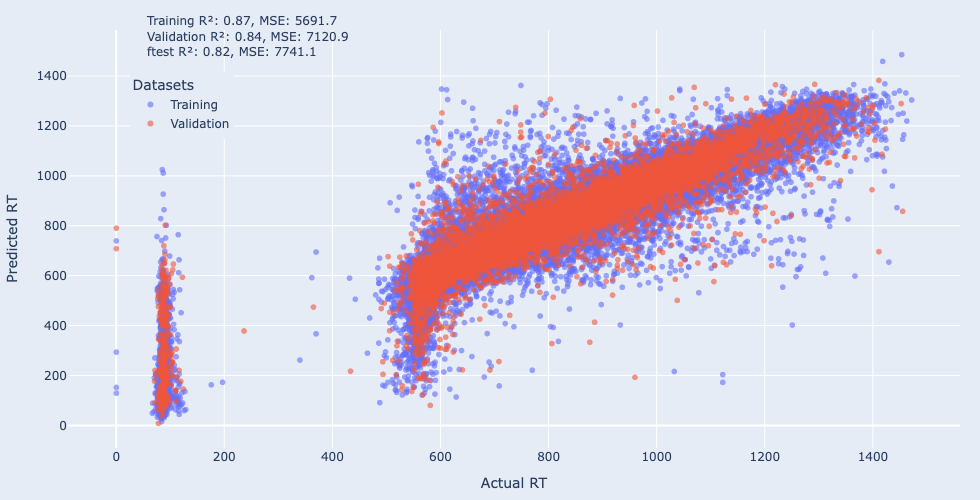

In [22]:
train_y_pred, train_y_true = make_prediction(config, train_loader)
#train_mse = mean_squared_error(train_y_true, train_y_pred.squeeze())
#train_r2 = r2_score(train_y_true, train_y_pred.squeeze())
#print(f"train r2={train_r2:.2} mse={train_mse:.2}")
valid_y_pred, valid_y_true = make_prediction(config, valid_loader)
#valid_mse = mean_squared_error(valid_y_true, valid_y_pred.squeeze())
#valid_r2 = r2_score(valid_y_true, valid_y_pred.squeeze())
#print(f"valid r2={valid_r2:.2} mse={valid_mse:.2}")
ftest_y_pred, ftest_y_true = make_prediction(config, ftest_loader)
#ftest_mse = mean_squared_error(ftest_y_true, ftest_y_pred.squeeze())
#ftest_r2 = r2_score(ftest_y_true, ftest_y_pred.squeeze())
#print(f"ftest r2={ftest_r2:.2} mse={ftest_mse:.2}")

# Combine training and validation for scatter plot
new_train_set = pd.DataFrame({"rt": train_y_true.numpy(),"predicted_rt": train_y_pred.numpy().squeeze()})
new_valid_set = pd.DataFrame({"rt": valid_y_true.numpy(),"predicted_rt": valid_y_pred.numpy().squeeze()})
new_train_set['set'] = 'Training'
new_valid_set['set'] = 'Validation'
combined_data = pd.concat([new_train_set[['rt', 'predicted_rt', 'set']], new_valid_set[['rt', 'predicted_rt', 'set']]])

# Scatter plot for training and validation sets
title_text = (
    f"Training R²: {train_r2:.2f}, MSE: {train_mse:.1f}<br>"
    f"Validation R²: {valid_r2:.2f}, MSE: {valid_mse:.1f}<br>"
    f"ftest R²: {ftest_r2:.2f}, MSE: {ftest_mse:.1f}"
)

fig = px.scatter(
    combined_data, x='rt', y='predicted_rt', color='set',
    title=title_text,
    labels={'rt': 'Actual RT', 'predicted_rt': 'Predicted RT'},
    opacity=0.6
)

fig.update_layout(
    plot_bgcolor='rgba(229, 236, 246,1)',
    paper_bgcolor='rgba(229, 236, 246,1)',
    width=800,
    height=500,
    margin=dict(l=20, r=20, t=30, b=20),
    title_font_size=12, # Adjust title font size here
    title_x=0.15, # Center the title horizontally (0 is left, 1 is right)
    title_y=0.95, # Adjust vertical position (0 is bottom, 1 is top)
    legend=dict(
        title="Datasets", # Change legend title
        yanchor="top",
        y=0.9,
        xanchor="left",
        x=0.07
    )
)

fig.show()
fig.write_image("images/Figure-3.7-GCN-Random-Opt.svg")

## GCN-Chronological model

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd
from pyg_chemprop_utils import smiles2data,initialize_weights
from pyg_chemprop import GCNEncoder,train,make_prediction
from torch_geometric.loader import DataLoader
import torch

import torch
import numpy as np
import random
import os

def seed_everything(seed: int = 42):
    """
    Set random seeds for reproducibility across PyTorch, NumPy, and Python.
    
    Args:
        seed: Integer seed value (default: 42)
    """
    # Set basic seeds
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    
    # CUDA-specific seeds (only if CUDA is available)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)  # if using multi-GPU
        
        # Set deterministic flags for CUDA (may impact performance)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False
        
        # Get CUDA device info for logging
        device_name = torch.cuda.get_device_name(0) if torch.cuda.device_count() > 0 else "Unknown"
        print(f"Set all random seeds to {seed} | Using GPU: {device_name}")
    else:
        print(f"Set all random seeds to {seed} | Using CPU only")
    
    return seed

# Usage example
seed_everything(42)

dataset = pd.read_csv("dataset/SMRT_dataset.csv").sort_values(by='date').reset_index(drop=True)
dataset_clean = dataset.iloc[:int(0.85*dataset.shape[0]),:]
ftest_set = dataset.iloc[int(0.85*dataset.shape[0]):,]
train_set,valid_set = dataset_clean.iloc[:int(0.824*dataset_clean.shape[0]),:], dataset_clean.iloc[int(0.824*dataset_clean.shape[0]):,:]
# Build graph dataset from train/valid splits
smiles_col = "SMILES"  # change if your column name differs
rt_col = "rt"          # change if your column name differs

train_graphs = []
for _, row in train_set.iterrows():
    data = smiles2data(row[smiles_col])
    data['y'] = row[rt_col]
    if data is not None:
        train_graphs.append(data)

valid_graphs = []
for _, row in valid_set.iterrows():
    data = smiles2data(row[smiles_col])
    data['y'] = row[rt_col]
    if data is not None:
        valid_graphs.append(data)

ftest_graphs = []
for _, row in ftest_set.iterrows():
    data = smiles2data(row[smiles_col])
    data['y'] = row[rt_col]
    if data is not None:
        ftest_graphs.append(data)
len(train_graphs), len(valid_graphs), len(ftest_graphs)

Set all random seeds to 42 | Using GPU: NVIDIA GeForce RTX 5090


(56058, 11974, 12006)

In [3]:
from pyg_chemprop import GCNEncoder
from torch_geometric.loader import DataLoader

# Set a global seed
seed = 42
torch.manual_seed(seed)

# Create a generator with the seed
generator = torch.Generator()
generator.manual_seed(seed)
batch_size=128
train_loader = DataLoader(train_graphs, batch_size=batch_size, shuffle=True, generator=generator)
valid_loader = DataLoader(valid_graphs, batch_size=batch_size, shuffle=False)
ftest_loader = DataLoader(ftest_graphs, batch_size=batch_size, shuffle=False)

In [4]:
num_epochs = 50
hidden_size = 512
depth = 3
out_dim = 1
dropout = 0.1

In [5]:
from torch import nn
head = nn.Sequential(
    nn.Linear(hidden_size, hidden_size, bias=True),
    nn.ReLU(),
    nn.Linear(hidden_size, hidden_size//2, bias=True),
    nn.ReLU(),
    nn.Linear(hidden_size//2, out_dim, bias=True),
)
model = nn.Sequential(
    GCNEncoder(
        hidden_size,
        train_loader.dataset[0].num_node_features,
        depth,
        dropout=dropout
    ),
    head,
)
initialize_weights(model)

In [6]:
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.MSELoss()
scheduler = torch.optim.lr_scheduler.OneCycleLR(
    optimizer, max_lr=1e-3, steps_per_epoch=len(train_loader), epochs=num_epochs
)
config = {
    "loss": criterion,
    "model": model,
    "optimizer": optimizer,
    "scheduler": scheduler,
}

In [7]:
from sklearn.metrics import mean_squared_error, r2_score
for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}")
    train(config, train_loader)
    y_pred, y_true = make_prediction(config, valid_loader)
    mse = mean_squared_error(y_true, y_pred.squeeze())
    r2 = r2_score(y_true, y_pred.squeeze())
    print(f"val r2={r2:.2} mse={mse:.2}")

Epoch 1


100%|██████████| 94/94 [00:00<00:00, 159.38it/s]


val r2=0.071 mse=3.9e+04
Epoch 2


100%|██████████| 94/94 [00:00<00:00, 163.79it/s]


val r2=0.12 mse=3.7e+04
Epoch 3


100%|██████████| 94/94 [00:01<00:00, 90.12it/s] 


val r2=0.16 mse=3.5e+04
Epoch 4


100%|██████████| 94/94 [00:00<00:00, 153.97it/s]


val r2=0.23 mse=3.2e+04
Epoch 5


100%|██████████| 94/94 [00:00<00:00, 166.95it/s]


val r2=0.32 mse=2.8e+04
Epoch 6


100%|██████████| 94/94 [00:00<00:00, 166.80it/s]


val r2=0.4 mse=2.5e+04
Epoch 7


100%|██████████| 94/94 [00:00<00:00, 162.68it/s]


val r2=0.43 mse=2.4e+04
Epoch 8


100%|██████████| 94/94 [00:00<00:00, 163.41it/s]


val r2=0.47 mse=2.2e+04
Epoch 9


100%|██████████| 94/94 [00:00<00:00, 168.77it/s]


val r2=0.48 mse=2.2e+04
Epoch 10


100%|██████████| 94/94 [00:00<00:00, 167.28it/s]


val r2=0.5 mse=2.1e+04
Epoch 11


100%|██████████| 94/94 [00:00<00:00, 164.68it/s]


val r2=0.52 mse=2e+04
Epoch 12


100%|██████████| 94/94 [00:00<00:00, 163.84it/s]


val r2=0.53 mse=1.9e+04
Epoch 13


100%|██████████| 94/94 [00:00<00:00, 165.56it/s]


val r2=0.55 mse=1.9e+04
Epoch 14


100%|██████████| 94/94 [00:00<00:00, 165.53it/s]


val r2=0.56 mse=1.8e+04
Epoch 15


100%|██████████| 94/94 [00:00<00:00, 164.72it/s]


val r2=0.55 mse=1.9e+04
Epoch 16


100%|██████████| 94/94 [00:00<00:00, 162.19it/s]


val r2=0.57 mse=1.8e+04
Epoch 17


100%|██████████| 94/94 [00:00<00:00, 163.25it/s]


val r2=0.56 mse=1.8e+04
Epoch 18


100%|██████████| 94/94 [00:01<00:00, 93.17it/s] 


val r2=0.59 mse=1.7e+04
Epoch 19


100%|██████████| 94/94 [00:00<00:00, 149.32it/s]


val r2=0.61 mse=1.6e+04
Epoch 20


100%|██████████| 94/94 [00:00<00:00, 153.92it/s]


val r2=0.6 mse=1.7e+04
Epoch 21


100%|██████████| 94/94 [00:00<00:00, 162.72it/s]


val r2=0.63 mse=1.5e+04
Epoch 22


100%|██████████| 94/94 [00:00<00:00, 163.36it/s]


val r2=0.64 mse=1.5e+04
Epoch 23


100%|██████████| 94/94 [00:00<00:00, 166.68it/s]


val r2=0.65 mse=1.4e+04
Epoch 24


100%|██████████| 94/94 [00:00<00:00, 166.43it/s]


val r2=0.63 mse=1.5e+04
Epoch 25


100%|██████████| 94/94 [00:00<00:00, 169.88it/s]


val r2=0.66 mse=1.4e+04
Epoch 26


100%|██████████| 94/94 [00:00<00:00, 164.78it/s]


val r2=0.65 mse=1.4e+04
Epoch 27


100%|██████████| 94/94 [00:00<00:00, 164.54it/s]


val r2=0.62 mse=1.6e+04
Epoch 28


100%|██████████| 94/94 [00:00<00:00, 167.37it/s]


val r2=0.67 mse=1.4e+04
Epoch 29


100%|██████████| 94/94 [00:00<00:00, 166.44it/s]


val r2=0.69 mse=1.3e+04
Epoch 30


100%|██████████| 94/94 [00:00<00:00, 164.99it/s]


val r2=0.68 mse=1.3e+04
Epoch 31


100%|██████████| 94/94 [00:00<00:00, 166.43it/s]


val r2=0.65 mse=1.5e+04
Epoch 32


100%|██████████| 94/94 [00:00<00:00, 165.86it/s]


val r2=0.69 mse=1.3e+04
Epoch 33


100%|██████████| 94/94 [00:00<00:00, 96.03it/s] 


val r2=0.7 mse=1.3e+04
Epoch 34


100%|██████████| 94/94 [00:00<00:00, 136.45it/s]


val r2=0.7 mse=1.3e+04
Epoch 35


100%|██████████| 94/94 [00:00<00:00, 165.52it/s]


val r2=0.71 mse=1.2e+04
Epoch 36


100%|██████████| 94/94 [00:00<00:00, 165.69it/s]


val r2=0.71 mse=1.2e+04
Epoch 37


100%|██████████| 94/94 [00:00<00:00, 167.32it/s]


val r2=0.71 mse=1.2e+04
Epoch 38


100%|██████████| 94/94 [00:00<00:00, 162.71it/s]


val r2=0.71 mse=1.2e+04
Epoch 39


100%|██████████| 94/94 [00:00<00:00, 161.35it/s]


val r2=0.71 mse=1.2e+04
Epoch 40


100%|██████████| 94/94 [00:00<00:00, 161.29it/s]


val r2=0.72 mse=1.2e+04
Epoch 41


100%|██████████| 94/94 [00:00<00:00, 156.72it/s]


val r2=0.72 mse=1.2e+04
Epoch 42


100%|██████████| 94/94 [00:00<00:00, 161.93it/s]


val r2=0.72 mse=1.2e+04
Epoch 43


100%|██████████| 94/94 [00:00<00:00, 164.56it/s]


val r2=0.72 mse=1.2e+04
Epoch 44


100%|██████████| 94/94 [00:00<00:00, 161.37it/s]


val r2=0.72 mse=1.2e+04
Epoch 45


100%|██████████| 94/94 [00:00<00:00, 163.21it/s]


val r2=0.72 mse=1.1e+04
Epoch 46


100%|██████████| 94/94 [00:00<00:00, 165.06it/s]


val r2=0.72 mse=1.1e+04
Epoch 47


100%|██████████| 94/94 [00:01<00:00, 88.87it/s] 


val r2=0.72 mse=1.2e+04
Epoch 48


100%|██████████| 94/94 [00:00<00:00, 143.12it/s]


val r2=0.73 mse=1.1e+04
Epoch 49


100%|██████████| 94/94 [00:00<00:00, 165.91it/s]


val r2=0.73 mse=1.1e+04
Epoch 50


100%|██████████| 94/94 [00:00<00:00, 164.56it/s]

val r2=0.72 mse=1.1e+04


100%|██████████| 94/94 [00:00<00:00, 162.42it/s]


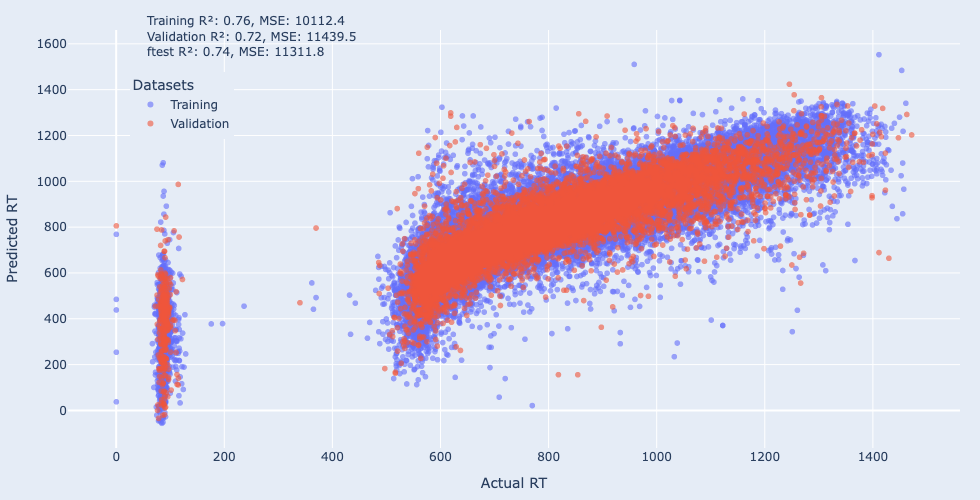

In [9]:
train_y_pred, train_y_true = make_prediction(config, train_loader)
train_mse = mean_squared_error(train_y_true, train_y_pred.squeeze())
train_r2 = r2_score(train_y_true, train_y_pred.squeeze())

valid_y_pred, valid_y_true = make_prediction(config, valid_loader)
valid_mse = mean_squared_error(valid_y_true, valid_y_pred.squeeze())
valid_r2 = r2_score(valid_y_true, valid_y_pred.squeeze())

ftest_y_pred, ftest_y_true = make_prediction(config, ftest_loader)
ftest_mse = mean_squared_error(ftest_y_true, ftest_y_pred.squeeze())
ftest_r2 = r2_score(ftest_y_true, ftest_y_pred.squeeze())


# Combine training and validation for scatter plot
new_train_set = pd.DataFrame({"rt": train_y_true.numpy(),"predicted_rt": train_y_pred.numpy().squeeze()})
new_valid_set = pd.DataFrame({"rt": valid_y_true.numpy(),"predicted_rt": valid_y_pred.numpy().squeeze()})
new_train_set['set'] = 'Training'
new_valid_set['set'] = 'Validation'
combined_data = pd.concat([new_train_set[['rt', 'predicted_rt', 'set']], new_valid_set[['rt', 'predicted_rt', 'set']]])

# Scatter plot for training and validation sets
title_text = (
    f"Training R²: {train_r2:.2f}, MSE: {train_mse:.1f}<br>"
    f"Validation R²: {valid_r2:.2f}, MSE: {valid_mse:.1f}<br>"
    f"ftest R²: {ftest_r2:.2f}, MSE: {ftest_mse:.1f}"
)

fig = px.scatter(
    combined_data, x='rt', y='predicted_rt', color='set',
    title=title_text,
    labels={'rt': 'Actual RT', 'predicted_rt': 'Predicted RT'},
    opacity=0.6
)

fig.update_layout(
    plot_bgcolor='rgba(229, 236, 246,1)',
    paper_bgcolor='rgba(229, 236, 246,1)',
    width=800,
    height=500,
    margin=dict(l=20, r=20, t=30, b=20),
    title_font_size=12, # Adjust title font size here
    title_x=0.15, # Center the title horizontally (0 is left, 1 is right)
    title_y=0.95, # Adjust vertical position (0 is bottom, 1 is top)
    legend=dict(
        title="Datasets", # Change legend title
        yanchor="top",
        y=0.9,
        xanchor="left",
        x=0.07
    )
)

fig.show()
fig.write_image("images/Figure-3.8-GCN-chronological-without-Opt.svg")

## Hyperparameters tuning for GCN-Chronological

In [29]:
import optuna
from torch import nn
import warnings
from pyg_chemprop import train_silent

# Suppress warnings
warnings.filterwarnings('ignore')

def objective(trial):
    # Hyperparameters to optimize
    hidden_size = trial.suggest_categorical('hidden_size', [128, 256, 512])
    depth = trial.suggest_int('depth', 2, 5)
    dropout = trial.suggest_float('dropout', 0.01, 0.5)
    learning_rate = trial.suggest_float('learning_rate', 1e-4, 1e-2, log=True)
    batch_size = trial.suggest_categorical('batch_size', [128, 256, 512])
    num_epochs = trial.suggest_int('num_epochs', 10, 100)
    
    
    # Using train_graphs and valid_graphs from the global scope
    train_loader_trial = DataLoader(train_graphs, batch_size=batch_size, shuffle=True)
    valid_loader_trial = DataLoader(valid_graphs, batch_size=batch_size, shuffle=False)
    
    # Model definition
    out_dim = 1
    head = nn.Sequential(
        nn.Linear(hidden_size, hidden_size, bias=True),
        nn.ReLU(),
        nn.Dropout(dropout),
        nn.Linear(hidden_size, hidden_size//2, bias=True),
        nn.ReLU(),
        nn.Dropout(dropout),
        nn.Linear(hidden_size//2, out_dim, bias=True),
    )
    
    model = nn.Sequential(
        GCNEncoder(
            hidden_size,
            train_graphs[0].num_node_features,
            depth,
            dropout=dropout
        ),
        head,
    )
    initialize_weights(model)
    
    # Training setup
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.MSELoss()
    
    scheduler = torch.optim.lr_scheduler.OneCycleLR(
        optimizer, max_lr=learning_rate*10, steps_per_epoch=len(train_loader_trial), epochs=num_epochs
    )
    
    config = {
        "loss": criterion,
        "model": model,
        "optimizer": optimizer,
        "scheduler": scheduler,
    }
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    # Training loop
    for epoch in range(num_epochs):
        train_silent(config, train_loader_trial, device=device)
        
    # Final Evaluation
    y_pred, y_true = make_prediction(config, valid_loader_trial, device=device)
    mse = mean_squared_error(y_true, y_pred.squeeze())
    
    return mse

# Visualization callback
n_trials = 50
cb, fig = make_plotly_optuna_callback(
    title="GCN Hyperparameter Optimization",
    yaxis_title="MSE",
    save_path="images/Figure-3.9-GCN-chronological-Optuna-Progress.svg",
    n_trials=n_trials,
)

# Run optimization
study_gcn = optuna.create_study(direction="minimize")
study_gcn.optimize(
    objective,
    n_trials=n_trials,
    callbacks=[cb]
)

FigureWidget({
    'data': [{'marker': {'size': 10},
              'mode': 'markers',
              'name': 'Trial value',
              'type': 'scatter',
              'uid': '3b82a664-5330-4cda-b375-d572614c72f0',
              'x': [],
              'y': []},
             {'mode': 'lines+markers',
              'name': 'Best so far',
              'type': 'scatter',
              'uid': '95aba469-5996-4743-92c5-dbf8393164f7',
              'x': [],
              'y': []}],
    'layout': {'height': 500,
               'legend': {'x': 0.8, 'xanchor': 'right', 'y': 0.8, 'yanchor': 'top'},
               'margin': {'b': 20, 'l': 20, 'r': 20, 't': 30},
               'paper_bgcolor': 'rgba(229, 236, 246,1)',
               'plot_bgcolor': 'rgba(229, 236, 246,1)',
               'template': '...',
               'width': 800,
               'xaxis': {'title': {'text': 'Trial'}},
               'yaxis': {'title': {'text': 'MSE'}}}
})

[I 2026-01-11 21:48:07,082] A new study created in memory with name: no-name-142f01e9-eb69-4982-a068-5d380d525ff5
100%|██████████| 94/94 [00:00<00:00, 133.06it/s]
[I 2026-01-11 21:52:58,426] Trial 0 finished with value: 9879.36328125 and parameters: {'hidden_size': 512, 'depth': 3, 'dropout': 0.398506081662079, 'learning_rate': 0.0004909062624928027, 'batch_size': 128, 'num_epochs': 69}. Best is trial 0 with value: 9879.36328125.
100%|██████████| 24/24 [00:00<00:00, 43.63it/s]
[I 2026-01-11 21:54:37,398] Trial 1 finished with value: 32325.681640625 and parameters: {'hidden_size': 512, 'depth': 2, 'dropout': 0.3035259213670251, 'learning_rate': 0.006668618840854345, 'batch_size': 512, 'num_epochs': 38}. Best is trial 0 with value: 9879.36328125.
100%|██████████| 24/24 [00:00<00:00, 44.58it/s]
[I 2026-01-11 21:58:13,929] Trial 2 finished with value: 313620.28125 and parameters: {'hidden_size': 128, 'depth': 5, 'dropout': 0.4996723865209109, 'learning_rate': 0.00716768731913842, 'batch_si

## Reproduce the best GCN-Chronological model

In [30]:
# Get the best parameters
best_params = study_gcn.best_params
print("Best parameters:", best_params)

# Extract params
hidden_size = best_params['hidden_size']
depth = best_params['depth']
dropout = best_params['dropout']
learning_rate = best_params['learning_rate']
batch_size = best_params['batch_size']
num_epochs = best_params['num_epochs']

# Recreate loaders with best batch size
train_loader_best = DataLoader(train_graphs, batch_size=batch_size, shuffle=True)
valid_loader_best = DataLoader(valid_graphs, batch_size=batch_size, shuffle=False)
ftest_loader_best = DataLoader(ftest_graphs, batch_size=batch_size, shuffle=False)

# Rebuild model
out_dim = 1
head = nn.Sequential(
    nn.Linear(hidden_size, hidden_size, bias=True),
    nn.ReLU(),
    nn.Dropout(dropout),
    nn.Linear(hidden_size, hidden_size//2, bias=True),
    nn.ReLU(),
    nn.Dropout(dropout),
    nn.Linear(hidden_size//2, out_dim, bias=True),
)

model = nn.Sequential(
    GCNEncoder(
        hidden_size,
        train_graphs[0].num_node_features,
        depth,
        dropout=dropout
    ),
    head,
)
initialize_weights(model)

# Training setup
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
criterion = nn.MSELoss()
scheduler = torch.optim.lr_scheduler.OneCycleLR(
    optimizer, max_lr=learning_rate*10, steps_per_epoch=len(train_loader_best), epochs=num_epochs
)

config = {
    "loss": criterion,
    "model": model,
    "optimizer": optimizer,
    "scheduler": scheduler,
}

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Train
for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}")
    train(config, train_loader_best, device=device) # Use the original train with tqdm
    y_pred, y_true = make_prediction(config, valid_loader_best, device=device)
    mse = mean_squared_error(y_true, y_pred.squeeze())
    r2 = r2_score(y_true, y_pred.squeeze())
    print(f"val r2={r2:.2} mse={mse:.2}")

# Final evaluation
train_y_pred, train_y_true = make_prediction(config, train_loader_best, device=device)
train_mse = mean_squared_error(train_y_true, train_y_pred.squeeze())
train_r2 = r2_score(train_y_true, train_y_pred.squeeze())
print(f"train r2={train_r2:.2} mse={train_mse:.2}")

valid_y_pred, valid_y_true = make_prediction(config, valid_loader_best, device=device)
valid_mse = mean_squared_error(valid_y_true, valid_y_pred.squeeze())
valid_r2 = r2_score(valid_y_true, valid_y_pred.squeeze())
print(f"valid r2={valid_r2:.2} mse={valid_mse:.2}")

ftest_y_pred, ftest_y_true = make_prediction(config, ftest_loader_best, device=device)
ftest_mse = mean_squared_error(ftest_y_true, ftest_y_pred.squeeze())
ftest_r2 = r2_score(ftest_y_true, ftest_y_pred.squeeze())
print(f"ftest r2={ftest_r2:.2} mse={ftest_mse:.2}")

Best parameters: {'hidden_size': 512, 'depth': 5, 'dropout': 0.12336586971803137, 'learning_rate': 0.0003047408049173123, 'batch_size': 128, 'num_epochs': 56}
Epoch 1


100%|██████████| 94/94 [00:00<00:00, 125.68it/s]


val r2=0.14 mse=3.6e+04
Epoch 2


100%|██████████| 94/94 [00:00<00:00, 125.81it/s]


val r2=0.24 mse=3.2e+04
Epoch 3


100%|██████████| 94/94 [00:00<00:00, 126.27it/s]


val r2=0.38 mse=2.6e+04
Epoch 4


100%|██████████| 94/94 [00:01<00:00, 70.94it/s] 


val r2=0.45 mse=2.3e+04
Epoch 5


100%|██████████| 94/94 [00:00<00:00, 122.41it/s]


val r2=0.51 mse=2e+04
Epoch 6


100%|██████████| 94/94 [00:00<00:00, 128.98it/s]


val r2=0.54 mse=1.9e+04
Epoch 7


100%|██████████| 94/94 [00:00<00:00, 127.62it/s]


val r2=0.56 mse=1.8e+04
Epoch 8


100%|██████████| 94/94 [00:00<00:00, 124.00it/s]


val r2=0.54 mse=1.9e+04
Epoch 9


100%|██████████| 94/94 [00:00<00:00, 124.75it/s]


val r2=0.57 mse=1.8e+04
Epoch 10


100%|██████████| 94/94 [00:00<00:00, 117.44it/s]


val r2=0.62 mse=1.6e+04
Epoch 11


100%|██████████| 94/94 [00:00<00:00, 126.05it/s]


val r2=0.59 mse=1.7e+04
Epoch 12


100%|██████████| 94/94 [00:00<00:00, 126.78it/s]


val r2=0.66 mse=1.4e+04
Epoch 13


100%|██████████| 94/94 [00:00<00:00, 125.17it/s]


val r2=0.65 mse=1.5e+04
Epoch 14


100%|██████████| 94/94 [00:00<00:00, 123.71it/s]


val r2=0.67 mse=1.4e+04
Epoch 15


100%|██████████| 94/94 [00:00<00:00, 111.73it/s]


val r2=0.66 mse=1.4e+04
Epoch 16


100%|██████████| 94/94 [00:00<00:00, 122.93it/s]


val r2=0.69 mse=1.3e+04
Epoch 17


100%|██████████| 94/94 [00:00<00:00, 124.02it/s]


val r2=0.69 mse=1.3e+04
Epoch 18


100%|██████████| 94/94 [00:00<00:00, 126.40it/s]


val r2=0.68 mse=1.3e+04
Epoch 19


100%|██████████| 94/94 [00:00<00:00, 126.87it/s]


val r2=0.7 mse=1.2e+04
Epoch 20


100%|██████████| 94/94 [00:00<00:00, 123.57it/s]


val r2=0.71 mse=1.2e+04
Epoch 21


100%|██████████| 94/94 [00:01<00:00, 72.46it/s] 


val r2=0.72 mse=1.2e+04
Epoch 22


100%|██████████| 94/94 [00:00<00:00, 123.31it/s]


val r2=0.74 mse=1.1e+04
Epoch 23


100%|██████████| 94/94 [00:00<00:00, 124.28it/s]


val r2=0.72 mse=1.2e+04
Epoch 24


100%|██████████| 94/94 [00:00<00:00, 120.30it/s]


val r2=0.71 mse=1.2e+04
Epoch 25


100%|██████████| 94/94 [00:00<00:00, 116.36it/s]


val r2=0.74 mse=1.1e+04
Epoch 26


100%|██████████| 94/94 [00:00<00:00, 115.77it/s]


val r2=0.71 mse=1.2e+04
Epoch 27


100%|██████████| 94/94 [00:00<00:00, 126.14it/s]


val r2=0.74 mse=1.1e+04
Epoch 28


100%|██████████| 94/94 [00:00<00:00, 122.75it/s]


val r2=0.76 mse=1e+04
Epoch 29


100%|██████████| 94/94 [00:00<00:00, 126.69it/s]


val r2=0.76 mse=1e+04
Epoch 30


100%|██████████| 94/94 [00:00<00:00, 128.03it/s]


val r2=0.76 mse=9.9e+03
Epoch 31


100%|██████████| 94/94 [00:00<00:00, 118.21it/s]


val r2=0.76 mse=9.8e+03
Epoch 32


100%|██████████| 94/94 [00:00<00:00, 125.31it/s]


val r2=0.76 mse=9.8e+03
Epoch 33


100%|██████████| 94/94 [00:00<00:00, 124.32it/s]


val r2=0.76 mse=1e+04
Epoch 34


100%|██████████| 94/94 [00:00<00:00, 115.89it/s]


val r2=0.76 mse=1e+04
Epoch 35


100%|██████████| 94/94 [00:00<00:00, 121.26it/s]


val r2=0.78 mse=9.2e+03
Epoch 36


100%|██████████| 94/94 [00:00<00:00, 124.56it/s]


val r2=0.77 mse=9.4e+03
Epoch 37


100%|██████████| 94/94 [00:01<00:00, 72.94it/s] 


val r2=0.78 mse=9.2e+03
Epoch 38


100%|██████████| 94/94 [00:00<00:00, 124.69it/s]


val r2=0.77 mse=9.6e+03
Epoch 39


100%|██████████| 94/94 [00:00<00:00, 126.19it/s]


val r2=0.78 mse=9e+03
Epoch 40


100%|██████████| 94/94 [00:00<00:00, 121.84it/s]


val r2=0.79 mse=8.7e+03
Epoch 41


100%|██████████| 94/94 [00:00<00:00, 124.11it/s]


val r2=0.79 mse=8.6e+03
Epoch 42


100%|██████████| 94/94 [00:00<00:00, 125.57it/s]


val r2=0.8 mse=8.5e+03
Epoch 43


100%|██████████| 94/94 [00:00<00:00, 127.66it/s]


val r2=0.8 mse=8.5e+03
Epoch 44


100%|██████████| 94/94 [00:00<00:00, 113.14it/s]


val r2=0.8 mse=8.5e+03
Epoch 45


100%|██████████| 94/94 [00:00<00:00, 122.07it/s]


val r2=0.8 mse=8.4e+03
Epoch 46


100%|██████████| 94/94 [00:00<00:00, 125.74it/s]


val r2=0.81 mse=8.1e+03
Epoch 47


100%|██████████| 94/94 [00:00<00:00, 125.97it/s]


val r2=0.81 mse=8e+03
Epoch 48


100%|██████████| 94/94 [00:00<00:00, 123.55it/s]


val r2=0.81 mse=7.9e+03
Epoch 49


100%|██████████| 94/94 [00:00<00:00, 121.92it/s]


val r2=0.81 mse=7.9e+03
Epoch 50


100%|██████████| 94/94 [00:00<00:00, 123.93it/s]


val r2=0.81 mse=7.9e+03
Epoch 51


100%|██████████| 94/94 [00:00<00:00, 126.55it/s]


val r2=0.81 mse=7.9e+03
Epoch 52


100%|██████████| 94/94 [00:00<00:00, 123.80it/s]


val r2=0.81 mse=7.9e+03
Epoch 53


100%|██████████| 94/94 [00:00<00:00, 123.59it/s]


val r2=0.81 mse=7.8e+03
Epoch 54


100%|██████████| 94/94 [00:00<00:00, 113.94it/s]


val r2=0.81 mse=7.8e+03
Epoch 55


100%|██████████| 94/94 [00:01<00:00, 73.51it/s] 


val r2=0.81 mse=7.8e+03
Epoch 56


100%|██████████| 94/94 [00:00<00:00, 121.68it/s]


val r2=0.81 mse=7.8e+03


100%|██████████| 438/438 [00:03<00:00, 120.16it/s]


train r2=0.86 mse=6e+03


100%|██████████| 94/94 [00:00<00:00, 127.01it/s]


valid r2=0.81 mse=7.8e+03


100%|██████████| 94/94 [00:00<00:00, 112.14it/s]


ftest r2=0.82 mse=8e+03


In [31]:
train_y_pred, train_y_true = make_prediction(config, train_loader)
#train_mse = mean_squared_error(train_y_true, train_y_pred.squeeze())
#train_r2 = r2_score(train_y_true, train_y_pred.squeeze())
#print(f"train r2={train_r2:.2} mse={train_mse:.2}")
valid_y_pred, valid_y_true = make_prediction(config, valid_loader)
#valid_mse = mean_squared_error(valid_y_true, valid_y_pred.squeeze())
#valid_r2 = r2_score(valid_y_true, valid_y_pred.squeeze())
#print(f"valid r2={valid_r2:.2} mse={valid_mse:.2}")
ftest_y_pred, ftest_y_true = make_prediction(config, ftest_loader)
#ftest_mse = mean_squared_error(ftest_y_true, ftest_y_pred.squeeze())
#ftest_r2 = r2_score(ftest_y_true, ftest_y_pred.squeeze())
#print(f"ftest r2={ftest_r2:.2} mse={ftest_mse:.2}")

# Combine training and validation for scatter plot
new_train_set = pd.DataFrame({"rt": train_y_true.numpy(),"predicted_rt": train_y_pred.numpy().squeeze()})
new_valid_set = pd.DataFrame({"rt": valid_y_true.numpy(),"predicted_rt": valid_y_pred.numpy().squeeze()})
new_train_set['set'] = 'Training'
new_valid_set['set'] = 'Validation'
combined_data = pd.concat([new_train_set[['rt', 'predicted_rt', 'set']], new_valid_set[['rt', 'predicted_rt', 'set']]])

# Scatter plot for training and validation sets
title_text = (
    f"Training R²: {train_r2:.2f}, MSE: {train_mse:.1f}<br>"
    f"Validation R²: {valid_r2:.2f}, MSE: {valid_mse:.1f}<br>"
    f"ftest R²: {ftest_r2:.2f}, MSE: {ftest_mse:.1f}"
)

fig = px.scatter(
    combined_data, x='rt', y='predicted_rt', color='set',
    title=title_text,
    labels={'rt': 'Actual RT', 'predicted_rt': 'Predicted RT'},
    opacity=0.6
)

fig.update_layout(
    plot_bgcolor='rgba(229, 236, 246,1)',
    paper_bgcolor='rgba(229, 236, 246,1)',
    width=800,
    height=500,
    margin=dict(l=20, r=20, t=30, b=20),
    title_font_size=12, # Adjust title font size here
    title_x=0.15, # Center the title horizontally (0 is left, 1 is right)
    title_y=0.95, # Adjust vertical position (0 is bottom, 1 is top)
    legend=dict(
        title="Datasets", # Change legend title
        yanchor="top",
        y=0.9,
        xanchor="left",
        x=0.07
    )
)

fig.show()
fig.write_image("images/Figure-3.10-GCN-chronological-Opt.svg")

100%|██████████| 94/94 [00:00<00:00, 125.52it/s]


In [32]:
import plotly.express as px
import pandas as pd

# Convert tensors to numpy
train_true_np = train_y_true.numpy()
train_pred_np = train_y_pred.squeeze().numpy()
valid_true_np = valid_y_true.numpy()
valid_pred_np = valid_y_pred.squeeze().numpy()

train_df = pd.DataFrame({'rt': train_true_np, 'predicted_rt': train_pred_np, 'set': 'Training'})
valid_df = pd.DataFrame({'rt': valid_true_np, 'predicted_rt': valid_pred_np, 'set': 'Validation'})
combined_data = pd.concat([train_df, valid_df])

# Scatter plot for training and validation sets
title_text = (
    f"Training R²: {train_r2:.2f}, MSE: {train_mse:.2f}<br>"
    f"Validation R²: {valid_r2:.2f}, MSE: {valid_mse:.2f}<br>"
    f"ftest R²: {ftest_r2:.2f}, MSE: {ftest_mse:.2f}"
)

fig = px.scatter(
    combined_data, x='rt', y='predicted_rt', color='set',
    title=title_text,
    labels={'rt': 'Experimental RT', 'predicted_rt': 'Predicted RT'},
    opacity=0.6
)

fig.update_layout(
    plot_bgcolor='rgba(229, 236, 246,1)',
    paper_bgcolor='rgba(229, 236, 246,1)',
    width=800,
    height=500,
    margin=dict(l=20, r=20, t=30, b=20),
    title_font_size=12, # Adjust title font size here
    title_x=0.15, # Center the title horizontally (0 is left, 1 is right)
    title_y=0.95, # Adjust vertical position (0 is bottom, 1 is top)
    legend=dict(
        title="Datasets", # Change legend title
        yanchor="top",
        y=0.9,
        xanchor="left",
        x=0.07
    )
)

fig.show()

In [ ]:
torch.save(model,'GCN_chronological_best_model.pt')

# Model performance visualization

In [3]:
# Reading from spreadsheet
import pandas as pd 
import plotly.graph_objects as go
df = pd.read_excel('model_performance_summary.xlsx')  # or pd.read_csv('your_file.csv')

# 1. R² Scores Grouped Bar Chart
fig_r2 = go.Figure()

# Add bars for LGBM
lgbm_df = df[df['Model'] == 'LGBM']
fig_r2.add_trace(go.Bar(
    name='LGBM - Validation',
    x=lgbm_df['Splitting'],
    y=lgbm_df['valid_r2'],
    text=lgbm_df['valid_r2'].round(3),
    textposition='auto',
    marker_color='#636EFA', # Plotly Blue
    hovertemplate='<b>Model:</b> LGBM<br><b>Splitting:</b> %{x}<br><b>R²:</b> %{y:.3f}<br><b>Dataset:</b> Validation<extra></extra>'
))

fig_r2.add_trace(go.Bar(
    name='LGBM - Test',
    x=lgbm_df['Splitting'],
    y=lgbm_df['ftest_r2'],
    text=lgbm_df['ftest_r2'].round(3),
    textposition='auto',
    marker_color='rgba(99, 110, 250, 0.5)', # Light Plotly Blue
    hovertemplate='<b>Model:</b> LGBM<br><b>Splitting:</b> %{x}<br><b>R²:</b> %{y:.3f}<br><b>Dataset:</b> Test<extra></extra>'
))

# Add bars for GCN
gcn_df = df[df['Model'] == 'GCN']
fig_r2.add_trace(go.Bar(
    name='GCN - Validation',
    x=gcn_df['Splitting'],
    y=gcn_df['valid_r2'],
    text=gcn_df['valid_r2'].round(3),
    textposition='auto',
    marker_color='#EF553B', # Plotly Red
    hovertemplate='<b>Model:</b> GCN<br><b>Splitting:</b> %{x}<br><b>R²:</b> %{y:.3f}<br><b>Dataset:</b> Validation<extra></extra>'
))

fig_r2.add_trace(go.Bar(
    name='GCN - Test',
    x=gcn_df['Splitting'],
    y=gcn_df['ftest_r2'],
    text=gcn_df['ftest_r2'].round(3),
    textposition='auto',
    marker_color='rgba(239, 85, 59, 0.5)', # Light Plotly Red
    hovertemplate='<b>Model:</b> GCN<br><b>Splitting:</b> %{x}<br><b>R²:</b> %{y:.3f}<br><b>Dataset:</b> Test<extra></extra>'
))

fig_r2.update_layout(
    # title='R² Scores by Model and Splitting Method',
    plot_bgcolor='rgba(229, 236, 246,1)',
    paper_bgcolor='rgba(229, 236, 246,1)',
    # xaxis_title='Splitting Method',
    yaxis_title='R²',
    yaxis_range=[0, 1],
    barmode='group',
    showlegend=True,
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=0.95,
        xanchor="right",
        x=0.8,
        font = dict(color='black')
    ),
    width = 800,
    height = 300,
    margin=dict(l=20, r=20, t=40, b=20), # Reduce margins
    # legend_title='Model & Dataset'
)

# 2. MSE Scores Grouped Bar Chart
fig_mse = go.Figure()

# Add bars for LGBM
fig_mse.add_trace(go.Bar(
    name='LGBM - Validation',
    x=lgbm_df['Splitting'],
    y=lgbm_df['valid_mse'],
    text=lgbm_df['valid_mse'].round(0),
    textposition='auto',
    marker_color='#636EFA', # Plotly Blue
    hovertemplate='<b>Model:</b> LGBM<br><b>Splitting:</b> %{x}<br><b>MSE:</b> %{y:,.0f}<br><b>Dataset:</b> Validation<extra></extra>'
))

fig_mse.add_trace(go.Bar(
    name='LGBM - ftest',
    x=lgbm_df['Splitting'],
    y=lgbm_df['ftest_mse'],
    text=lgbm_df['ftest_mse'].round(0),
    textposition='auto',
    marker_color='rgba(99, 110, 250, 0.5)', # Light Plotly Blue
    hovertemplate='<b>Model:</b> LGBM<br><b>Splitting:</b> %{x}<br><b>MSE:</b> %{y:,.0f}<br><b>Dataset:</b> Test<extra></extra>'
))

# Add bars for GCN
fig_mse.add_trace(go.Bar(
    name='GCN - Validation',
    x=gcn_df['Splitting'],
    y=gcn_df['valid_mse'],
    text=gcn_df['valid_mse'].round(0),
    textposition='auto',
    marker_color='#EF553B', # Plotly Red
    hovertemplate='<b>Model:</b> GCN<br><b>Splitting:</b> %{x}<br><b>MSE:</b> %{y:,.0f}<br><b>Dataset:</b> Validation<extra></extra>'
))

fig_mse.add_trace(go.Bar(
    name='GCN - ftest',
    x=gcn_df['Splitting'],
    y=gcn_df['ftest_mse'],
    text=gcn_df['ftest_mse'].round(0),
    textposition='auto',
    marker_color='rgba(239, 85, 59, 0.5)', # Light Plotly Red
    hovertemplate='<b>Model:</b> GCN<br><b>Splitting:</b> %{x}<br><b>MSE:</b> %{y:,.0f}<br><b>Dataset:</b> Test<extra></extra>'
))

fig_mse.update_layout(
    # title='MSE Scores by Model and Splitting Method',
    plot_bgcolor='rgba(229, 236, 246,1)',
    paper_bgcolor='rgba(229, 236, 246,1)',
    #xaxis_title='Splitting Method',
    yaxis_title='MSE',
    barmode='group',
    showlegend=False,
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=0.95,
        xanchor="right",
        x=0.8,
        font = dict(color='black')
    ),
    width = 800,
    height = 300,
    margin=dict(l=20, r=20, t=40, b=20), # Reduce margins
)
fig_mse.update_xaxes(title_font=dict(size=14, color='black'),
                 tickfont=dict(size=12, color='black'))
fig_mse.update_yaxes(title_font=dict(size=14, color='black'),
                 tickfont=dict(size=12, color='black'))
# Show the figures
fig_r2.update_xaxes(title_font=dict(size=14, color='black'),
                 tickfont=dict(size=12, color='black'))
fig_r2.update_yaxes(title_font=dict(size=14, color='black'),
                 tickfont=dict(size=12, color='black'))
fig_r2.show()
fig_mse.show()
fig_r2.write_image("images/Figure-3.x1-r2_scores.svg", scale=2)
fig_mse.write_image("images/Figure-3.x2-mse_scores.svg", scale=2)